# Demonstracja metody Canny

**Przedmiot:** Analiza danych obrazowych i multimedialnych

**Metoda:** Canny Edge Detection / detekcja krawędzi metodą Canny

> TO DO: **Autorzy:** `[imię i nazwisko 1]`, `[imię i nazwisko 2]`, `[imię i nazwisko 3]`, `[imię i nazwisko 4]`

**Data realizacji:** [01.06.2026]

## 1. Krótkie omówienie metody

Metoda **Canny** służy do wykrywania **krawędzi**, czyli obszarów obrazu,
w których występuje gwałtowna zmiana jasności. Jest jednym z klasycznych
i często stosowanych detektorów krawędzi, ponieważ pozwala uzyskać cienkie,
dobrze zlokalizowane i stosunkowo odporne na szum kontury.

Algorytm Canny'ego można przedstawić jako **kaskadę kolejnych etapów**,
w której wynik jednego kroku staje się wejściem dla następnego:

```text
    obraz wejściowy
    -> (1) wygładzenie filtrem Gaussa
    -> (2) obliczenie gradientów Gx i Gy, np. operatorem Sobela lub Scharra
    -> (3) wyznaczenie magnitudy i kierunku gradientu
    -> (4) usunięcie niemaksymalnych pikseli, czyli Non-Maximum Suppression
    -> (5) progowanie z histerezą
    -> binarna mapa krawędzi (0/255)
```

W pierwszym kroku obraz jest wygładzany, aby ograniczyć wpływ szumu. Następnie
obliczane są gradienty jasności w kierunku poziomym i pionowym. Na ich podstawie
wyznaczana jest magnituda gradientu, określająca siłę potencjalnej krawędzi,
oraz kierunek gradientu, potrzebny do pocieniania konturów. Po etapie
usunięcia niemaksymalnych pikseli pozostają głównie lokalne maksima odpowiedzi
gradientowej. Ostatecznie progowanie z histerezą rozróżnia silne i słabe
krawędzie oraz zachowuje tylko te słabe piksele, które są połączone z silnymi
krawędziami.

W tym notatniku pokazujemy **przykładową implementację** tych etapów
(`my_canny`, oparta na NumPy/SciPy) oraz interaktywne demo z suwakami.
Implementacja `cv.Canny` z  biblioteki OpenCV jest traktowana jako wynik **referencyjny** do porównania z naszą implementacją. `cv.Canny` wykorzystaliśmy również podczas naszych eksperymentów.

>TO DO: [`podać linki do bardziej szczegółowych omówień, tutoriali, do repozytoriów kodu`]

## 2. Przygotowanie środowiska

Wymagane biblioteki:

- **NumPy / SciPy** — operacje macierzowe i splot (cała implementacja `my_canny`),
- **OpenCV** (`cv2`) — wyłącznie wczytywanie obrazów i wynik referencyjny `cv.Canny`,
- **Matplotlib** — wizualizacja statyczna,
- **ipywidgets** — interaktywne demo (suwaki, dropdowny, upload).

Komórka poniżej doinstaluje brakujące pakiety w aktywnym kernelu.

In [1]:
import importlib.util
import subprocess
import sys

required = {
    "numpy": "numpy",
    "scipy": "scipy",
    "matplotlib": "matplotlib",
    "cv2": "opencv-python",
    "ipywidgets": "ipywidgets",
    }
for module_name, package_name in required.items():
    if importlib.util.find_spec(module_name) is None:
        print(f"Instaluję {package_name} ...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package_name])
    else:
        print(f"{package_name}: OK")

numpy: OK
scipy: OK
matplotlib: OK
opencv-python: OK
Instaluję ipywidgets ...


In [2]:
import io
import os
from math import comb

import numpy as np
from scipy.ndimage import convolve, label  # pyright: ignore[reportMissingImports]

import cv2 as cv  # pyright: ignore[reportMissingImports]
import matplotlib.pyplot as plt
from matplotlib.figure import Figure
from matplotlib.backends.backend_agg import FigureCanvasAgg

import ipywidgets as widgets  # pyright: ignore[reportMissingImports]
from IPython.display import display  # pyright: ignore[reportMissingImports]

np.set_printoptions(precision=3, suppress=True)

## 3. Wczytywanie obrazów

Canny operuje na zmianach **intensywności** w jednym kanale, dlatego obrazy
wczytujemy od razu w skali szarości (`cv.IMREAD_GRAYSCALE`). Format `uint8`
(0–255) jest też tym, którego oczekuje referencyjne `cv.Canny`.

`SAMPLES` to słownik z gotowymi przykładami z katalogu `./data`.
Filtrujemy go po `os.path.exists`, żeby uniknąć błędu, jeśli któryś plik
nie został pobrany.

Obraz referencyjny: PKiN (./data/PKiN_widziany_z_WFC.jpg), kształt = (2756, 2026), dtype = uint8


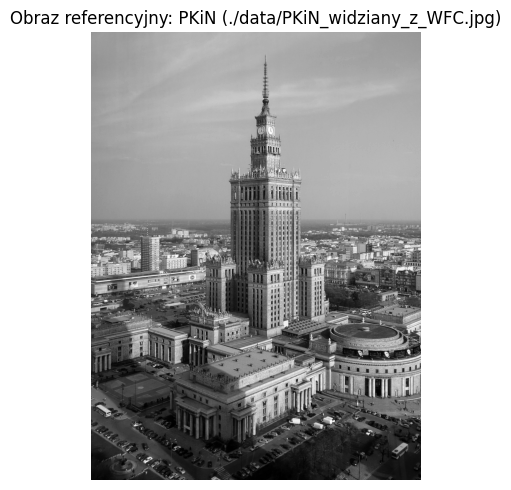

In [3]:
SAMPLES = {
    "PKiN (./data/PKiN_widziany_z_WFC.jpg)": "./data/PKiN_widziany_z_WFC.jpg",
    "Ronaldo (./data/ronaldo.jpg)":           "./data/ronaldo.jpg",
    "Cherries (./data/cherries.png)":         "./data/cherries.png",
    "DBS Superleggera (./data/DBS_Superleggera.jpg)": "./data/DBS_Superleggera.jpg",
    }
SAMPLES = {k: v for k, v in SAMPLES.items() if os.path.exists(v)}

if not SAMPLES:
    raise FileNotFoundError(
        "Brak obrazów w ./data. Upewnij się, że katalog 'data' istnieje "
        "i zawiera przynajmniej jeden z plików zdefiniowanych w SAMPLES."
        )


def load_grayscale(path: str) -> np.ndarray:
    '''Wczytanie obrazu w skali szarości, walidacja typu i wymiarów.'''
    img = cv.imread(path, cv.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(f"Nie udało się wczytać obrazu: {path}")
    if img.dtype != np.uint8:
        img = img.astype(np.uint8)
    return img


REF_NAME = next(iter(SAMPLES))
REF_IMG = load_grayscale(SAMPLES[REF_NAME])
print(f"Obraz referencyjny: {REF_NAME}, kształt = {REF_IMG.shape}, dtype = {REF_IMG.dtype}")

plt.figure(figsize=(6, 5))
plt.imshow(REF_IMG, cmap="gray")
plt.title(f"Obraz referencyjny: {REF_NAME}")
plt.axis("off")
plt.tight_layout()
plt.show()

## 4. Implementacja etapów metody Canny

Każdy etap pokazujemy jako osobną funkcję + krótką wizualizację na obrazie
referencyjnym. Składamy je na końcu w `my_canny` (zwraca mapę krawędzi)
oraz `my_canny_steps` (zwraca słownik z wynikami pośrednimi — wizualizacja etapów algorytmu).

In [4]:
# Współdzielone widgety dla interaktywnych demo (sekcje 4.1, 4.2.1, 5)
# To są POJEDYNCZE obiekty wyświetlane w wielu komórkach jednocześnie!
# Przesunięcie suwaka w jednej sekcji odświeży WSZYSTKIE podpięte podglądy.

shared_ksize    = widgets.IntSlider(value=5, min=1, max=15, step=2,
                                     description="Gauss k", continuous_update=False,
                                     layout=widgets.Layout(width="320px"))
shared_sigma    = widgets.FloatSlider(value=1.4, min=0.0, max=5.0, step=0.1,
                                       description="σ Gauss", continuous_update=False,
                                       readout_format=".2f",
                                       layout=widgets.Layout(width="320px"))
shared_aperture = widgets.Dropdown(options=[3, 5, 7], value=3,
                                    description="apertureSize",
                                    layout=widgets.Layout(width="200px"))
shared_scharr   = widgets.Checkbox(value=False, description="Scharr (zamiast Sobela)")
shared_L2       = widgets.Checkbox(value=False, description="L2 gradient")
shared_t1       = widgets.IntSlider(value=100, min=0, max=500, step=5,
                                     description="T1 (low)", continuous_update=False,
                                     layout=widgets.Layout(width="320px"))
shared_t2       = widgets.IntSlider(value=200, min=0, max=500, step=5,
                                     description="T2 (high)", continuous_update=False,
                                     layout=widgets.Layout(width="320px"))


def fig_to_png_bytes(fig: Figure) -> bytes:
    '''Renderuje matplotlib.Figure do PNG-bajtów (bez pyplot, unika dublowania w VS Code).'''
    canvas = FigureCanvasAgg(fig)
    buf = io.BytesIO()
    canvas.print_png(buf)
    return buf.getvalue()


print("Współdzielone widgety gotowe.")
print("Te same obiekty pojawią się w sekcjach 4.1, 4.2.1 i 5 — zmiana jednej kontrolki odświeży wszystkie podpięte dema.")

Współdzielone widgety gotowe.
Te same obiekty pojawią się w sekcjach 4.1, 4.2.1 i 5 — zmiana jednej kontrolki odświeży wszystkie podpięte dema.


### 4.1. Filtr Gaussa

**Po co?** Surowy obraz zawiera szum — bez wygładzenia każdy pojedynczy
piksel szumu wygenerowałby silny gradient i fałszywą krawędź. Splot z
jądrem Gaussa działa jak filtr dolnoprzepustowy: tłumi wysokie częstotliwości
(szum, mikrostrukturę), zachowując strukturę obrazu.

**Parametry:**

- `gaussian_ksize` — rozmiar jądra (nieparzysty); im większy, tym silniejsze
  rozmycie, ale tracimy też drobne krawędzie,
- `sigma` — odchylenie standardowe Gaussa; gdy `sigma <= 0`, używamy
  konwencji OpenCV: `sigma = 0.3 * ((ksize - 1) * 0.5 - 1) + 0.8`.

Implementacja korzysta z **separowalności** filtru Gaussa — splot z jądrem
2D zastępujemy dwoma splotami 1D (poziom + pion), co jest tańsze i tak samo
dokładne.

In [ ]:
def gaussian_kernel_1d(ksize: int, sigma: float) -> np.ndarray:
    '''Jednowymiarowe jądro Gaussa o sumie 1.'''
    if sigma <= 0:
        sigma = 0.3 * ((ksize - 1) * 0.5 - 1) + 0.8  # konwencja OpenCV
    half = ksize // 2
    x = np.arange(-half, half + 1, dtype=np.float64)
    g = np.exp(-(x ** 2) / (2.0 * sigma ** 2))
    return g / g.sum()


def gaussian_blur(image: np.ndarray, ksize: int, sigma: float) -> np.ndarray:
    '''Wygładzenie obrazu separowalnym filtrem Gaussa (zwraca float64).'''
    img = image.astype(np.float64)
    if ksize is None or ksize <= 1:
        return img
    if ksize % 2 == 0:
        ksize += 1  # jądro musi być nieparzyste
    g = gaussian_kernel_1d(ksize, sigma)
    smoothed = convolve(img, g[None, :], mode="reflect")
    smoothed = convolve(smoothed, g[:,  None], mode="reflect")
    return smoothed


# Wartości referencyjne (statyczne) są używane w dalszych sekcjach 4.2 / 4.3 / 4.4
_REF_KSIZE, _REF_SIGMA = 5, 1.4
REF_BLURRED = gaussian_blur(REF_IMG, _REF_KSIZE, _REF_SIGMA)
print(f"Wartości referencyjne: ksize = {_REF_KSIZE}, σ = {_REF_SIGMA}")
print(f"Przykładowe jądro 1D (ksize=5, σ=1.4): " f"{np.round(gaussian_kernel_1d(5, 1.4), 4).tolist()}")

Wartości referencyjne: ksize = 5, σ = 1.4
Przykładowe jądro 1D (ksize=5, σ=1.4): [0.1102, 0.2369, 0.3058, 0.2369, 0.1102]


In [ ]:
# Interaktywne demo Gaussa
# Widgety k / σ są WSPÓŁDZIELONE z sekcjami 4.2.1 i 5 - zmiana odświeży też podgląd gradientu i pełny potok.
gauss_img_widget = widgets.Image(format="png", layout=widgets.Layout(max_width="1300px"))
gauss_status = widgets.HTML()


def render_gauss(*_):
    ksize = shared_ksize.value
    sigma = shared_sigma.value
    blurred = gaussian_blur(REF_IMG, ksize, sigma)
    diff = np.abs(REF_IMG.astype(np.float64) - blurred)

    fig = Figure(figsize=(13, 4.2), dpi=100)
    axes = fig.subplots(1, 3)
    axes[0].imshow(REF_IMG, cmap="gray"); axes[0].set_title("Oryginał", fontsize=10); axes[0].axis("off")
    axes[1].imshow(blurred, cmap="gray")
    axes[1].set_title(f"Po Gaussie (k={ksize}, σ={sigma:.2f})", fontsize=10); axes[1].axis("off")
    axes[2].imshow(diff, cmap="hot", vmin=0, vmax=max(1.0, diff.max()))
    axes[2].set_title(f"|oryginał − blur|   max = {diff.max():.1f}", fontsize=10); axes[2].axis("off")
    fig.tight_layout()
    gauss_img_widget.value = fig_to_png_bytes(fig)

    g = gaussian_kernel_1d(max(1, ksize) if ksize % 2 == 1 else ksize + 1, sigma)
    gauss_status.value = (
        f"<code>k={ksize}, σ={sigma:.2f}</code> &nbsp; "
        f"Jądro 1D = {np.round(g, 3).tolist()}"
        )


shared_ksize.observe(render_gauss, names="value")
shared_sigma.observe(render_gauss, names="value")

render_gauss()
display(
    widgets.HBox([shared_ksize, shared_sigma]),
    gauss_status,
    gauss_img_widget,
    )

HTML(value='<code>k=5, σ=1.40</code> &nbsp; Jądro 1D = [0.11, 0.237, 0.306, 0.237, 0.11]')

Image(value=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x14\x00\x00\x01\xa4\x08\x06\x00\x00\x00@c\xa9\x8…

### 4.2. Obliczenie gradientu

Gradient obrazu opisuje **lokalną zmianę jasności** — kierunek największego
przyrostu i jej siłę. Dla obrazu 2D potrzebujemy dwóch składowych:
`Gx` (po osi poziomej) i `Gy` (po osi pionowej). Liczymy je splotem
z odpowiednim operatorem różniczkującym.

#### 4.2.1. Sobel vs Scharr

Wyznaczenie **pochodnej kierunkowej** obrazu odbywa się przez dyskretny
**splot 2D** macierzy obrazu z macierzą $K \times K$ charakterystyczną
dla danego kierunku, zwaną **jądrem (kernel)** przekształcenia:

$$
G_x(i, j) = \sum_{u=-r}^{r} \sum_{v=-r}^{r} I(i+u,\, j+v) \cdot K_x(u, v)
\qquad\text{gdzie } r = \lfloor K/2 \rfloor.
$$

Macierze te są **antysymetryczne** względem osi prostopadłej do kierunku
wykrywanej krawędzi — środkowa kolumna (dla $K_x$) lub środkowy wiersz
(dla $K_y$) ma same zera, a po obu stronach występują wartości
o **przeciwnych znakach**. Dzięki temu splot z $K_x$ liczy *różnicę*
intensywności po lewej i po prawej stronie piksela — czyli przybliżenie
pochodnej, a nie wartości średniej.

##### Operator Sobela

Sobel `3×3` to klasyk:

$$
S_x = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}
\qquad
S_y = S_x^{\top}
$$

Antysymetria: $S_x(i, -j) = -S_x(i, j)$ — kolumna `+1` i kolumna `−1`
to lustrzane odbicie ze zmianą znaku, kolumna środkowa zerowa.

Kluczowa obserwacja: **$S_x$ rozkłada się na iloczyn zewnętrzny dwóch
wektorów 1D** (jest *separowalny*):

$$
S_x \;=\; \underbrace{\begin{bmatrix} 1 \\ 2 \\ 1 \end{bmatrix}}_{\text{wygładzanie}}
       \;\otimes\;
       \underbrace{\begin{bmatrix} -1 & 0 & 1 \end{bmatrix}}_{\text{pochodna}}
$$

##### Co to jest "wiersz Pascala"?

Pierwszy wektor `[1, 2, 1]` to **trzeci wiersz trójkąta Pascala**, czyli
ciąg współczynników dwumianowych:

$$
\binom{n}{0},\; \binom{n}{1},\; \dots,\; \binom{n}{n}
\qquad\text{dla } n = K - 1.
$$

Trójkąt Pascala:

```
n=0:                 1
n=1:               1   1
n=2:             1   2   1          <- wygładzanie Sobela 3×3
n=3:           1   3   3   1
n=4:         1   4   6   4   1      <- wygładzanie Sobela 5×5
n=5:       1   5  10  10   5   1
n=6:     1   6  15  20  15   6   1  <- wygładzanie Sobela 7×7
```

Każdy wiersz to dyskretne **przybliżenie rozkładu Gaussa** o coraz większym
nośniku (centralne twierdzenie graniczne: $K$-krotne złożenie filtra
`[1, 1] / 2` zbiega do Gaussa). Stąd, gdy weźmiemy wiersz Pascala jako
filtr wygładzający, dostaniemy operator dwuwymiarowy, który jednocześnie
**uśrednia** wzdłuż osi prostopadłej do gradientu i **różniczkuje**
wzdłuż gradientu — czyli klasycznego Sobela.

##### Uogólnienie na większe maski (`apertureSize = 5, 7, …`)

Dla dowolnego nieparzystego $K$:

- **wektor wygładzający** = $K$-ty wiersz Pascala (stopnia $n = K-1$),
- **wektor pochodnej**    = *różnica* dwóch sąsiednich wierszy Pascala
  stopnia $n-1$:
  $\;d_i = \binom{n-1}{i-1} - \binom{n-1}{i}\;$ (dla $i = 0, \dots, K-1$).

Stąd dokładnie ten kawałek kodu z funkcji `sobel_kernels`:
`deriv[i] = _c(n-1, i-1) - _c(n-1, i)`.

| `aperture_size` | wektor wygładzający (wiersz Pascala) | wektor pochodnej |
|---:|---|---|
| 3 | `[1, 2, 1]`                  | `[-1,  0,  1]`               |
| 5 | `[1, 4, 6, 4, 1]`            | `[-1, -2,  0,  2,  1]`       |
| 7 | `[1, 6, 15, 20, 15, 6, 1]`   | `[-1, -4, -5,  0,  5,  4, 1]`|

Większy `apertureSize` to silniejsze wygładzenie + szerszy nośnik pochodnej co przekłada się na **mniej szumu, ale grubsze krawędzie** i wolniejsze obliczenia.

##### Operator Scharra

Scharr to **ustalone jądro `3×3`**, zaprojektowane tak, by minimalizować
*błąd rotacyjny* — czyli żeby gradient policzony na obróconym obrazie
był maksymalnie zgodny z obróconym gradientem oryginału:

$$
\mathrm{Sch}_x = \begin{bmatrix} -3 & 0 & 3 \\ -10 & 0 & 10 \\ -3 & 0 & 3 \end{bmatrix}
\qquad
\mathrm{Sch}_y = \mathrm{Sch}_x^{\top}
$$

Także antysymetryczny, też separowalny (`[3, 10, 3]` ⊗ `[-1, 0, 1]`),
ale współczynniki wygładzania (`3, 10, 3`) są dobrane *liczbowo*
przez Scharra, a nie wzięte z trójkąta Pascala (tam by było `1, 2, 1`).

**Praktyczna różnica:** dla maski `3×3` Scharr daje *stabilniejszy*
gradient w kierunkach skośnych niż Sobel `3×3` (mniejszy błąd kątowy).
Dla większych masek (5, 7) Sobel zwykle dogania jakością.

W demo poniżej można na żywo przełączać `apertureSize` (3/5/7) i Scharra,
i obserwować, jak rośnie wygładzenie gradientu wraz z większą maską.

In [ ]:
def sobel_kernels(ksize: int) -> tuple[np.ndarray, np.ndarray]:
    '''Separowalne jądra Sobela: outer(wiersz Pascala, pochodna binomialna).'''
    if ksize % 2 == 0 or ksize < 3:
        raise ValueError("ksize musi być nieparzysty i >= 3")
    n = ksize - 1

    def _c(a: int, b: int) -> int:
        return comb(a, b) if 0 <= b <= a else 0

    smooth = np.array([_c(n, i) for i in range(ksize)], dtype=np.float64)
    deriv  = np.array([_c(n - 1, i - 1) - _c(n - 1, i) for i in range(ksize)],
                      dtype=np.float64)
    kx = np.outer(smooth, deriv) # gradient po osi X (kolumny)
    ky = np.outer(deriv, smooth) # gradient po osi Y (wiersze)
    return kx, ky


SCHARR_X = np.array([[-3,  0,  3],
                     [-10, 0, 10],
                     [-3,  0,  3]], dtype=np.float64)
SCHARR_Y = SCHARR_X.T


def compute_gradient(blurred: np.ndarray, aperture_size: int = 3,
                     use_scharr: bool = False) -> tuple[np.ndarray, np.ndarray]:
    '''Składowe gradientu Gx, Gy obliczone Sobelem lub Scharrem.'''
    if use_scharr:
        kx, ky = SCHARR_X, SCHARR_Y
    else:
        kx, ky = sobel_kernels(aperture_size)
    gx = convolve(blurred, kx, mode="reflect")
    gy = convolve(blurred, ky, mode="reflect")
    return gx, gy


# Wartości referencyjne (statyczne, używane w sekcjach 4.2.2, 4.3, 4.4)
REF_GX, REF_GY = compute_gradient(REF_BLURRED, aperture_size=3, use_scharr=False)

# Demonstracja: jak wygląda jądro Sobela dla różnych aperture_size
for k in (3, 5, 7):
    kx, _ = sobel_kernels(k)
    n = k - 1
    pascal = [comb(n, i) for i in range(k)]
    print(f"ksize={k}  |  wiersz Pascala (n={n}): {pascal}")
    print(f"         |  jądro Sobel kx:")
    for row in kx.astype(int):
        print("            ", row)
    print()

ksize=3  |  wiersz Pascala (n=2): [1, 2, 1]
         |  jądro Sobel kx:
             [-1  0  1]
             [-2  0  2]
             [-1  0  1]

ksize=5  |  wiersz Pascala (n=4): [1, 4, 6, 4, 1]
         |  jądro Sobel kx:
             [-1 -2  0  2  1]
             [-4 -8  0  8  4]
             [ -6 -12   0  12   6]
             [-4 -8  0  8  4]
             [-1 -2  0  2  1]

ksize=7  |  wiersz Pascala (n=6): [1, 6, 15, 20, 15, 6, 1]
         |  jądro Sobel kx:
             [-1 -4 -5  0  5  4  1]
             [ -6 -24 -30   0  30  24   6]
             [-15 -60 -75   0  75  60  15]
             [ -20  -80 -100    0  100   80   20]
             [-15 -60 -75   0  75  60  15]
             [ -6 -24 -30   0  30  24   6]
             [-1 -4 -5  0  5  4  1]



In [ ]:
# Interaktywne demo gradientu
# Widgety apertureSize / Scharr są WSPÓŁDZIELONE z sekcją 5 - zmiana tutaj odświeży też pełny potok niżej. Demo używa też shared_ksize / shared_sigma z sekcji 4.1 (gradient liczymy na rozmytym obrazie).
grad_img_widget = widgets.Image(format="png", layout=widgets.Layout(max_width="1300px"))
grad_status = widgets.HTML()


def render_gradient(*_):
    blurred = gaussian_blur(REF_IMG, shared_ksize.value, shared_sigma.value)
    gx, gy = compute_gradient(blurred,
                              aperture_size=shared_aperture.value,
                              use_scharr=shared_scharr.value
                              )
    mag = np.abs(gx) + np.abs(gy)
    op = "Scharr 3x3" if shared_scharr.value else f"Sobel {shared_aperture.value}x{shared_aperture.value}"

    fig = Figure(figsize=(13, 4.2), dpi=100)
    axes = fig.subplots(1, 3)
    vlim = float(np.abs(gx).max())
    axes[0].imshow(gx, cmap="seismic", vmin=-vlim, vmax=vlim)
    axes[0].set_title(f"Gx  ({op})", fontsize=10); axes[0].axis("off")
    vlim = float(np.abs(gy).max())
    axes[1].imshow(gy, cmap="seismic", vmin=-vlim, vmax=vlim)
    axes[1].set_title(f"Gy  ({op})", fontsize=10); axes[1].axis("off")
    axes[2].imshow(mag, cmap="gray")
    axes[2].set_title(f"|G| = |Gx| + |Gy|   max={mag.max():.0f}", fontsize=10); axes[2].axis("off")
    fig.tight_layout()
    grad_img_widget.value = fig_to_png_bytes(fig)
    grad_status.value = (
        f"<code>Operator: {op}</code> &nbsp; "
        f"(rozmycie wejścia: k={shared_ksize.value}, σ={shared_sigma.value:.2f})"
        )


for w in (shared_ksize, shared_sigma, shared_aperture, shared_scharr):
    w.observe(render_gradient, names="value")

render_gradient()
display(
    widgets.HBox([shared_aperture, shared_scharr]),
    grad_status,
    grad_img_widget,
    )

HTML(value='<code>Operator: Sobel 3x3</code> &nbsp; (rozmycie wejścia: k=5, σ=1.40)')

Image(value=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x14\x00\x00\x01\xa4\x08\x06\x00\x00\x00@c\xa9\x8…

#### 4.2.2. Magnituda i kierunek

Ze składowych `Gx`, `Gy` wyliczamy:

- **magnitudę** $|\nabla I| = \sqrt{G_x^2 + G_y^2}$ (norma `L2`) lub jej
  szybsze przybliżenie $|G_x| + |G_y|$ (norma `L1`). To "siła" krawędzi.
- **kierunek** $\theta = \mathrm{arctan2}(G_y, G_x)$ — kąt gradientu w pełnym
  zakresie $(-\pi, \pi]$, z poprawnie obsłużonymi znakami obu składowych.
  Wartość $\theta$ decyduje, którzy sąsiedzi piksela są używani w NMS.

Wybór L1 / L2 jest sterowany flagą `L2gradient` — taką samą jak w `cv.Canny`.

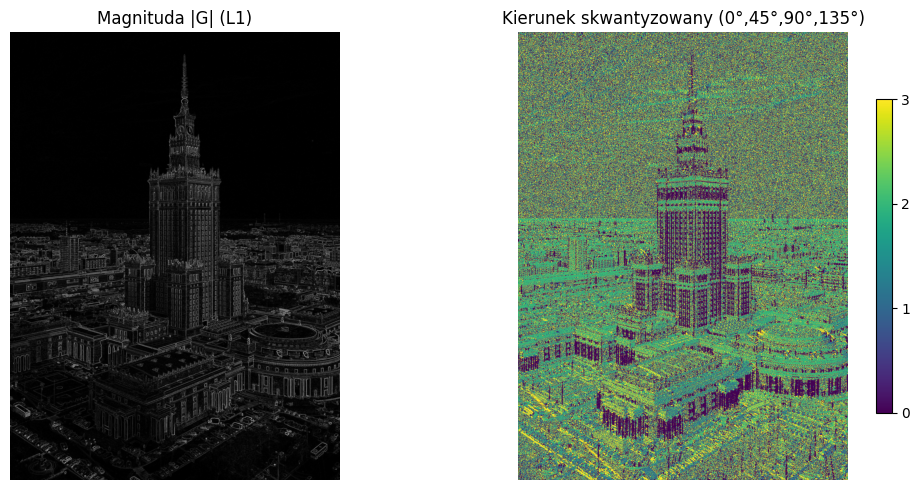

In [ ]:
def magnitude_and_angle(gx: np.ndarray, gy: np.ndarray, L2gradient: bool = False) -> tuple[np.ndarray, np.ndarray]:
    '''Magnituda |G| (L1 lub L2) oraz kierunek gradientu w radianach.'''
    magnitude = np.hypot(gx, gy) if L2gradient else (np.abs(gx) + np.abs(gy))
    angle = np.arctan2(gy, gx)
    return magnitude, angle


REF_MAG, REF_ANG = magnitude_and_angle(REF_GX, REF_GY, L2gradient=False)

# Kierunek skwantyzowany do 4 sektorów (te same, których użyje NMS)
angle_deg = (np.rad2deg(REF_ANG) % 180.0)
quantised = np.zeros_like(angle_deg, dtype=np.uint8)
quantised[(angle_deg < 22.5) | (angle_deg >= 157.5)] = 0 # poziom
quantised[(angle_deg >= 22.5) & (angle_deg < 67.5)] = 1 # / (przekątna)
quantised[(angle_deg >= 67.5) & (angle_deg < 112.5)] = 2 # pion
quantised[(angle_deg >= 112.5) & (angle_deg < 157.5)] = 3 # \ (przekątna)

fig, axes = plt.subplots(1, 2, figsize=(11, 5))
axes[0].imshow(REF_MAG, cmap="gray"); axes[0].set_title("Magnituda |G| (L1)"); axes[0].axis("off")
im = axes[1].imshow(quantised, cmap="viridis")
axes[1].set_title("Kierunek skwantyzowany (0°,45°,90°,135°)")
axes[1].axis("off")
plt.colorbar(im, ax=axes[1], ticks=[0, 1, 2, 3], shrink=0.7)
plt.tight_layout(); plt.show()

### 4.3. Usunięcie niemaksymalnych pikseli (Non-Maximum Suppression)

Po wyliczeniu magnitudy krawędzie są **grube** — gradient jest niezerowy
w całym pasie wokół rzeczywistej krawędzi. NMS „przerzedza” ten pas,
zostawiając w każdym profilu tylko **lokalne maksimum wzdłuż kierunku
gradientu** — dzięki temu krawędzie mają szerokość 1 piksela.

**Schemat działania:**

1. Kąt $\theta$ kwantyzujemy do czterech sektorów: 0°, 45°, 90°, 135°.
2. Dla każdego piksela wybieramy dwóch sąsiadów leżących **wzdłuż kierunku
   gradientu** (czyli prostopadle do krawędzi).
3. Piksel zostaje, jeśli jego magnituda jest niemniejsza od obu sąsiadów;
   w przeciwnym razie tłumimy go do 0.

> **Subtelność z konwencją obrazu:** w obrazach (NumPy/OpenCV) oś $y$
> rośnie *w dół*, więc `arctan2(gy, gx) = 45°` to gradient skierowany
> w **prawo-w-dół (SE)**, a nie NE jak w standardzie matematycznym.
> Dlatego dla sektora `d45` porównujemy z sąsiadami **UL** i **DR**
> (przekątna „\\"), a dla `d135` — z **UR** i **DL** (przekątna "/").
> OpenCV w `cv.Canny` rozróżnia te dwie przekątne po znaku iloczynu
> $g_x \cdot g_y$.

Sąsiadów liczymy wektorowo, jako przesunięte plastry obrazu z paddingiem —
bez ani jednej pętli `for` po pikselach.

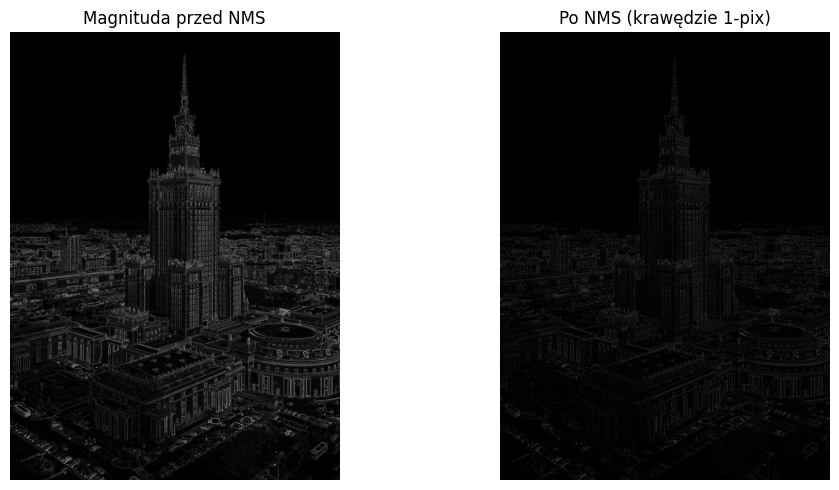

In [ ]:
def non_max_suppression(magnitude: np.ndarray, angle: np.ndarray) -> np.ndarray:
    '''Pozostawia tylko lokalne maksima |G| wzdłuż kierunku gradientu (kwantyzacja 4-sektorowa).'''
    deg = (np.rad2deg(angle) % 180.0)

    d0   = (deg < 22.5) | (deg >= 157.5)
    d45  = (deg >= 22.5)  & (deg < 67.5)
    d90  = (deg >= 67.5)  & (deg < 112.5)
    d135 = (deg >= 112.5) & (deg < 157.5)

    padded = np.pad(magnitude, 1, mode="constant", constant_values=0.0)
    left   = padded[1:-1, :-2]
    right  = padded[1:-1, 2:]
    up     = padded[:-2,  1:-1]
    down   = padded[2:,   1:-1]
    ul     = padded[:-2,  :-2]
    ur     = padded[:-2,  2:]
    dl     = padded[2:,   :-2]
    dr     = padded[2:,   2:]

    # UWAGA na konwencję obrazu (oś y rośnie W DÓŁ):
    # - arctan2(gy, gx) == d45  -> gradient kieruje się SE -> wzdłuż gradientu są UL i DR ("\")
    # - arctan2(gy, gx) == d135 -> gradient kieruje się SW -> wzdłuż gradientu są UR i DL ("/")
    # (Zgodnie z implementacją cv.Canny w OpenCV: s = sign(gx) XOR sign(gy)).
    keep = np.zeros_like(magnitude, dtype=bool)
    keep |= d0 & (magnitude >= left) & (magnitude >= right)
    keep |= d45 & (magnitude >= ul) & (magnitude >= dr)
    keep |= d90 & (magnitude >= up) & (magnitude >= down)
    keep |= d135 & (magnitude >= ur) & (magnitude >= dl)

    out = np.zeros_like(magnitude)
    out[keep] = magnitude[keep]
    return out

REF_NMS = non_max_suppression(REF_MAG, REF_ANG)

fig, axes = plt.subplots(1, 2, figsize=(11, 5))
axes[0].imshow(REF_MAG, cmap="gray"); axes[0].set_title("Magnituda przed NMS"); axes[0].axis("off")
axes[1].imshow(REF_NMS, cmap="gray"); axes[1].set_title("Po NMS (krawędzie 1-pix)"); axes[1].axis("off")
plt.tight_layout(); plt.show()

**Demo na obrazie 7×7 — "uśmiech".** Wszystkie etapy detekcji (od surowego
obrazu po mapę NMS) liczymy dla **jednego, wspólnego obrazu 7x7 w kształcie
uśmiechu**, którego oczy dotykają górnej krawędzi.
Ten sam obraz wykorzystujemy w sekcji 4.4 do histerezy, gdzie
klasyfikujemy piksele po NMS jako silne / słabe-zachowane /
słabe-odrzucone.

**Skład obrazu:**

- *Tło:* `220` (jasne piksele).
- *Oczy + usta:* `30` (bardzo ciemne, ostry kontrast `220 - 30 = 190`).
- *Pieprzyk w (6, 6):* `160` (średnia jasność, słaby kontrast `220 - 160 = 60`)
  — celowo umieszczony daleko od reszty smile'a, żeby pokazać przypadek
  izolowanego słabego piksela w sekcji 4.4.

**Skąd biorą się konkretne liczby w panelu "magnituda"?**

Łańcuch przekształceń: `piksel źródłowy -> Gauss -> Sobel -> |G|`.

1. *Gauss k=3, σ=0.8* rozmazuje krawędzie na pasmo ~3 pikseli — piksel
   tła obok ciemnego oka spada np. z `220` do ~`145`.
2. *Sobel 3×3* `Kx = [[-1,0,1],[-2,0,2],[-1,0,1]]` liczy dyskretną
   pochodną. Dla idealnej, niesplotowej krawędzi `30 -> 220` dałby
   `max|Kx| = (1+2+1)·190 = 760`. Po Gaussie skok jest rozciągnięty,
   więc pojedyncze piksele dają mniej, ale jest ich więcej.
3. *Magnituda L1* `|G| = |Gx| + |Gy|`. Dla diagonalnej krawędzi
   `Gx ≈ ±Gy`, więc `|G|` osiąga ~`2·max|Gx|`.

Konkretne wartości, które zobaczysz w wizualizacji:

| wartość \|G\| | gdzie / dlaczego |
|---:|---|
| **~370–393** | peak gradientu wokół ust — kilka połączonych ciemnych pikseli wzajemnie wzmacnia gradient |
| **~215–328** | gradient wokół izolowanych oczu (1-pikselowe ciemne kropki) |
| **~158** | pieprzyk (6,6) — kontrast `60` zamiast `190`, więc magnituda ~3× mniejsza |
| **~80** | DOKŁADNIE na ciemnym pikselu oka (np. (0,1)) — symetria sprawia, że pochodna jest tam mała; peak jest *wokół* oka, nie w nim |
| **0** | tło z dala od krawędzi |

NMS pozostawi tylko **lokalne maksima wzdłuż gradientu** — wszystkie
"boczne ścianki" grzbietów magnitudy zostaną stłumione do 0
(zaznaczone na czerwono w panelu 3).

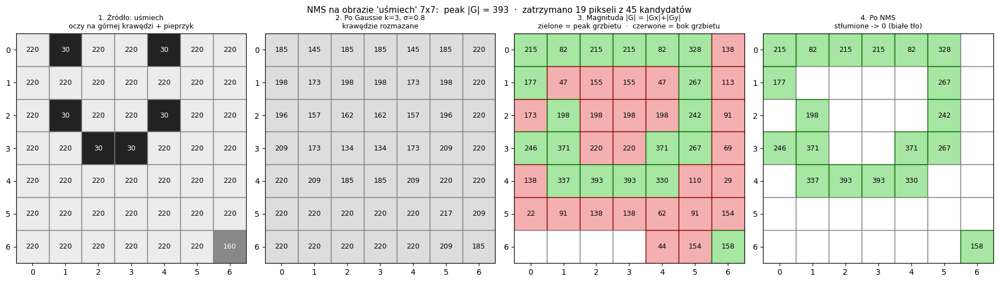

In [ ]:
# Demo NMS na obrazie "uśmiech" 7x7 (ten sam obraz służy w sekcji 4.4)
# Pełny pipeline (RAW -> GAUSS -> SOBEL -> |G| -> NMS) liczymy raz i zapisujemy w SMILE_* - sekcja 4.4 (histereza) konsumuje SMILE_NMS.

SMILE_RAW = np.full((7, 7), 220, dtype=np.float64) # jasne tło
SMILE_RAW[0, 1] = 30 # lewe oko
SMILE_RAW[0, 4] = 30 # prawe oko
SMILE_RAW[2, 1] = 30 # lewy kącik ust
SMILE_RAW[2, 4] = 30 # prawy kącik ust
SMILE_RAW[3, 2] = 30 # dół ust
SMILE_RAW[3, 3] = 30
SMILE_RAW[6, 6] = 160 # pieprzyk: niski kontrast, izolowany w rogu

SMILE_BLUR = gaussian_blur(SMILE_RAW, 3, 0.8)
SMILE_GX, SMILE_GY = compute_gradient(SMILE_BLUR, aperture_size=3)
SMILE_MAG, SMILE_ANG = magnitude_and_angle(SMILE_GX, SMILE_GY, L2gradient=False)
SMILE_NMS = non_max_suppression(SMILE_MAG, SMILE_ANG)

_kept = SMILE_NMS > 0
_suppressed = (SMILE_MAG > 5) & (SMILE_NMS == 0)


def _draw_grid(ax, data, kept_mask, suppressed_mask, title, val_thr=5,
               default_face="white"):
    h, w = data.shape
    for i in range(h):
        for j in range(w):
            v = data[i, j]
            if kept_mask is not None and kept_mask[i, j]:
                face, edge = "#a8e6a3", "darkgreen"
            elif suppressed_mask is not None and suppressed_mask[i, j]:
                face, edge = "#f4b0b0", "darkred"
            else:
                face, edge = default_face, "gray"
            ax.add_patch(plt.Rectangle((j - 0.5, i - 0.5), 1.0, 1.0,
                                         facecolor=face, edgecolor=edge, lw=1.0))
            if v > val_thr:
                ax.text(j, i, f"{v:.0f}", ha="center", va="center", fontsize=9)
    ax.set_xlim(-0.5, w - 0.5); ax.set_ylim(h - 0.5, -0.5); ax.set_aspect("equal")
    ax.set_xticks(range(w)); ax.set_yticks(range(h))
    ax.set_title(title, fontsize=9)


fig, axes = plt.subplots(1, 4, figsize=(18, 5))

# Panel 1: źródło - kodowanie intensywnością piksela (ciemne = dark)
for i in range(7):
    for j in range(7):
        v = SMILE_RAW[i, j]
        if v <= 50:    face, col = "#222222", "white"
        elif v <= 180: face, col = "#888888", "white"
        else:          face, col = "#ececec", "black"
        axes[0].add_patch(plt.Rectangle((j-0.5, i-0.5), 1, 1, facecolor=face, edgecolor="gray"))
        axes[0].text(j, i, f"{int(v)}", ha="center", va="center", color=col, fontsize=9)
axes[0].set_xlim(-0.5, 6.5); axes[0].set_ylim(6.5, -0.5); axes[0].set_aspect("equal")
axes[0].set_xticks(range(7)); axes[0].set_yticks(range(7))
axes[0].set_title("1. Źródło: uśmiech\noczy na górnej krawędzi + pieprzyk", fontsize=9)

# Panel 2: po Gaussie
_draw_grid(axes[1], SMILE_BLUR, None, None,
           "2. Po Gaussie k=3, σ=0.8\nkrawędzie rozmazane",
           default_face="#dddddd")

# Panel 3: magnituda PRZED NMS (zielone zostają, czerwone tłumione)
_draw_grid(axes[2], SMILE_MAG, _kept, _suppressed,
           "3. Magnituda |G| = |Gx|+|Gy|\nzielone = peak grzbietu  ·  czerwone = bok grzbietu")

# Panel 4: po NMS
_draw_grid(axes[3], SMILE_NMS, _kept, np.zeros_like(_kept, dtype=bool),
           "4. Po NMS\nstłumione -> 0 (białe tło)")

plt.suptitle(
    f"NMS na obrazie 'uśmiech' 7x7:  peak |G| = {SMILE_MAG.max():.0f}  ·  "
    f"zatrzymano {int(_kept.sum())} pikseli z {int((SMILE_MAG > 5).sum())} kandydatów",
    fontsize=11,
    )
plt.tight_layout(); plt.show()

### 4.4. Progowanie z histerezą

Po NMS mamy „cienki" obraz magnitud, ale nadal z różnymi wartościami.
**Podwójne progowanie z histerezą** zamienia go na binarną mapę krawędzi
w trzech krokach:

1. **Silne piksele** — $|G| \ge \text{threshold2}$ — są na pewno krawędziami.
2. **Słabe piksele** — $\text{threshold1} \le |G| < \text{threshold2}$ —
   są krawędziami **tylko jeśli** są spójne (8-sąsiedztwo) z którąś silną
   krawędzią.
3. Reszta zostaje odrzucona.

Dzięki temu pojedyncze, izolowane „mocne szumy" znikają, a długie kontury
o zmiennej sile pozostają nieprzerwane.

**Implementacja:** zamiast iteracyjnego BFS używamy etykietowania
spójnych komponentów (`scipy.ndimage.label`) na masce
`słabe ∪ silne` — komponent przeżywa wtedy i tylko wtedy, gdy zawiera
przynajmniej jeden silny piksel.

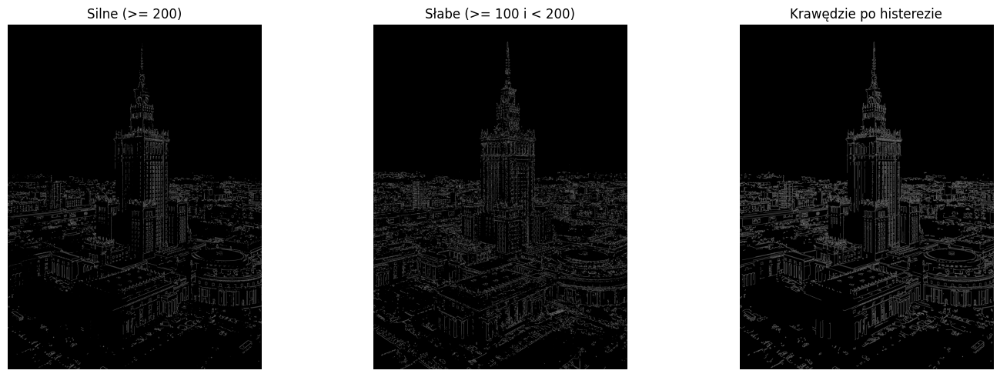

In [ ]:
def hysteresis_threshold(nms: np.ndarray, low: float, high: float) -> dict:
    '''Podwójny próg + propagacja w 8-spójności. Zwraca silne/słabe/edges.'''
    strong = nms >= high
    weak   = (nms >= low) & ~strong
    candidates = strong | weak

    labels, _ = label(candidates, structure=np.ones((3, 3), dtype=np.uint8))
    strong_ids = np.unique(labels[strong])
    strong_ids = strong_ids[strong_ids > 0]
    edges = np.isin(labels, strong_ids)
    return {
        "strong": strong,
        "weak":   weak,
        "edges":  (edges.astype(np.uint8) * 255),
        }


_REF_T1, _REF_T2 = 100, 200
_ref_hyst = hysteresis_threshold(REF_NMS, _REF_T1, _REF_T2)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(_ref_hyst["strong"], cmap="gray")
axes[0].set_title(f"Silne (>= {_REF_T2})"); axes[0].axis("off")
axes[1].imshow(_ref_hyst["weak"], cmap="gray")
axes[1].set_title(f"Słabe (>= {_REF_T1} i < {_REF_T2})"); axes[1].axis("off")
axes[2].imshow(_ref_hyst["edges"], cmap="gray")
axes[2].set_title("Krawędzie po histerezie"); axes[2].axis("off")
plt.tight_layout(); plt.show()

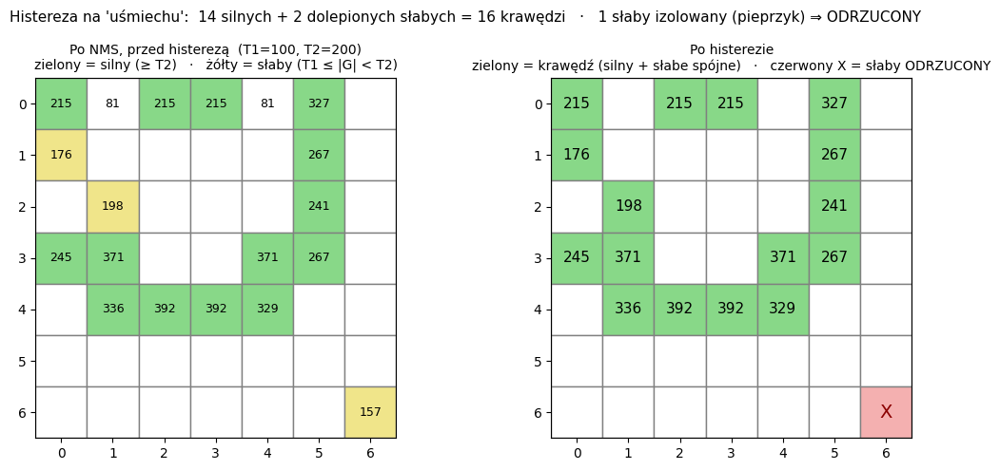

In [ ]:
# Demo histerezy na obrazie "uśmiech" - TEN SAM OBRAZ co w sekcji 4.3
# Korzystamy z SMILE_NMS policzonego w sekcji 4.3 (panel 4 powyżej).
# Progi T1=100, T2=200 dobrane tak, by w naszym obrazie pojawiły się WSZYSTKIE
# trzy przypadki histerezy:
# - silne piksele (>= T2) są zawsze kept (grzbiety oczu i ust)
# - słabe piksele (T1..T2) 8-spójne ze silnym są kept (saved) (kilka pikseli przy lewym oku / ustach)
# - słabe piksele izolowane (komponenta bez silnego) są DROPPED  (PIEPRZYK w (6,6))

T_LOW_DEMO, T_HIGH_DEMO = 100, 200
_hd = hysteresis_threshold(SMILE_NMS, T_LOW_DEMO, T_HIGH_DEMO)
_strong = _hd["strong"]; _weak = _hd["weak"]
_edges  = _hd["edges"] > 0
_weak_saved   = _weak & _edges
_weak_dropped = _weak & ~_edges

fig, axes = plt.subplots(1, 2, figsize=(11, 5))
h, w = SMILE_NMS.shape

# Lewy panel: stan po NMS, przed histerezą
for i in range(h):
    for j in range(w):
        v = SMILE_NMS[i, j]
        if _strong[i, j]:   face = "#88d888" # silny - zielony
        elif _weak[i, j]:   face = "#f0e58a" # słaby - żółty
        else:               face = "white"
        axes[0].add_patch(plt.Rectangle((j - 0.5, i - 0.5), 1.0, 1.0,
                                          facecolor=face, edgecolor="gray", lw=1))
        if v > 0:
            axes[0].text(j, i, f"{int(v)}", ha="center", va="center", fontsize=9)
axes[0].set_xlim(-0.5, w - 0.5); axes[0].set_ylim(h - 0.5, -0.5); axes[0].set_aspect("equal")
axes[0].set_xticks(range(w)); axes[0].set_yticks(range(h))
axes[0].set_title(f"Po NMS, przed histerezą  (T1={T_LOW_DEMO}, T2={T_HIGH_DEMO})\n"
                  "zielony = silny (≥ T2)   ·   żółty = słaby (T1 ≤ |G| < T2)",
                  fontsize=10)

# Prawy panel: po histerezie
for i in range(h):
    for j in range(w):
        if _edges[i, j]:
            face, sym, col = "#88d888", f"{int(SMILE_NMS[i, j])}", "black"
        elif _weak_dropped[i, j]:
            face, sym, col = "#f4b0b0", "X", "darkred"
        else:
            face, sym, col = "white", "", "black"
        axes[1].add_patch(plt.Rectangle((j - 0.5, i - 0.5), 1.0, 1.0,
                                          facecolor=face, edgecolor="gray", lw=1))
        if sym:
            axes[1].text(j, i, sym, ha="center", va="center",
                         fontsize=11 if sym != "X" else 14, color=col)
axes[1].set_xlim(-0.5, w - 0.5); axes[1].set_ylim(h - 0.5, -0.5); axes[1].set_aspect("equal")
axes[1].set_xticks(range(w)); axes[1].set_yticks(range(h))
axes[1].set_title("Po histerezie\n"
                  "zielony = krawędź (silny + słabe spójne)   ·   "
                  "czerwony X = słaby ODRZUCONY",
                  fontsize=10)

plt.suptitle(
    f"Histereza na 'uśmiechu':  {int(_strong.sum())} silnych + "
    f"{int(_weak_saved.sum())} dolepionych słabych = {int(_edges.sum())} krawędzi   ·   "
    f"{int(_weak_dropped.sum())} słaby izolowany (pieprzyk) ⇒ ODRZUCONY",
    fontsize=11,
    )
plt.tight_layout(); plt.show()

### 4.5. Złożenie etapów: `my_canny` i `my_canny_steps`

Łączymy wszystkie etapy w dwie funkcje:

- `my_canny(...)` — interfejs analogiczny do `cv.Canny`; zwraca mapę krawędzi
  `uint8` (0 / 255).
- `my_canny_steps(...)` — to samo, ale dodatkowo zwraca słownik z wynikami
  pośrednimi (`blurred`, `gx`, `gy`, `magnitude`, `angle`, `nms`,
  `strong`, `weak`, `edges`). Używamy go w sekcji 5 do wizualizacji
  całego potoku „w jednym miejscu".

my_canny() i my_canny_steps() gotowe.


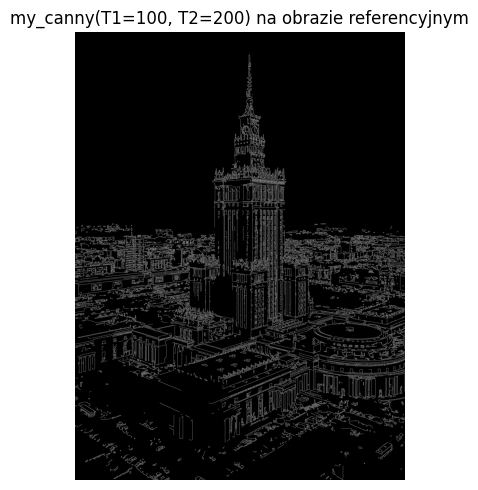

In [ ]:
def my_canny_steps(
    image: np.ndarray,
    threshold1: float,
    threshold2: float,
    aperture_size: int = 3,
    L2gradient: bool = False,
    gaussian_ksize: int = 5,
    sigma: float = 0.0,
    use_scharr: bool = False,
    ) -> dict:
    '''Pełny potok Canny'ego — zwraca wszystkie wyniki pośrednie.'''
    if image.ndim != 2:
        raise ValueError("Oczekiwany obraz w skali szarości (2D).")

    t_low, t_high = sorted((float(threshold1), float(threshold2)))

    blurred = gaussian_blur(image, gaussian_ksize, sigma)
    gx, gy  = compute_gradient(blurred, aperture_size=aperture_size, use_scharr=use_scharr)
    magnitude, angle = magnitude_and_angle(gx, gy, L2gradient=L2gradient)
    nms = non_max_suppression(magnitude, angle)
    hyst = hysteresis_threshold(nms, t_low, t_high)

    return {
        "blurred": blurred,
        "gx": gx,
        "gy": gy,
        "magnitude": magnitude,
        "angle": angle,
        "nms": nms,
        "strong": hyst["strong"],
        "weak": hyst["weak"],
        "edges": hyst["edges"],
        }


def my_canny(
    image: np.ndarray,
    threshold1: float,
    threshold2: float,
    aperture_size: int = 3,
    L2gradient: bool = False,
    gaussian_ksize: int = 5,
    sigma: float = 0.0,
    use_scharr: bool = False,
    ) -> np.ndarray:
    '''Mapa krawędzi (uint8 0/255), interfejs zgodny z cv.Canny.'''
    return my_canny_steps(
        image, threshold1, threshold2,
        aperture_size=aperture_size, L2gradient=L2gradient,
        gaussian_ksize=gaussian_ksize, sigma=sigma, use_scharr=use_scharr,
        )["edges"]


REF_EDGES = my_canny(REF_IMG, 100, 200)
print("my_canny() i my_canny_steps() gotowe.")

fig, ax = plt.subplots(figsize=(7, 5))
ax.imshow(REF_EDGES, cmap="gray")
ax.set_title(f"my_canny(T1=100, T2=200) na obrazie referencyjnym")
ax.axis("off")
plt.tight_layout();
plt.show()

## 5. Wizualizacja etapów pośrednich (interaktywna)

Na jednym obrazie referencyjnym pokazujemy **wszystko, co dzieje się
wewnątrz `my_canny`** — od oryginału do mapy krawędzi. Każdy panel
odpowiada jednemu etapowi z sekcji 4.

Suwaki i checkboxy poniżej są **te same obiekty** co w sekcjach 4.1 i 4.2.1
— przesunięcie suwaka tu odświeży też tamte podglądy i odwrotnie. Możesz
więc dobierać parametry „lokalnie" w sekcjach 4.x i obserwować ich wpływ
na cały potok bez przewijania.

In [ ]:
pipeline_img_widget = widgets.Image(format="png", layout=widgets.Layout(max_width="1300px"))
pipeline_status = widgets.HTML()


def render_pipeline(*_):
    params = dict(
        threshold1 = shared_t1.value,
        threshold2 = shared_t2.value,
        aperture_size = shared_aperture.value,
        L2gradient = shared_L2.value,
        gaussian_ksize = shared_ksize.value,
        sigma = shared_sigma.value,
        use_scharr = shared_scharr.value,
        )
    steps = my_canny_steps(REF_IMG, **params)
    op = "Scharr 3x3" if params["use_scharr"] else f"Sobel {params['aperture_size']}x{params['aperture_size']}"
    norm = "L2" if params["L2gradient"] else "L1"

    panels = [
        (REF_IMG, "1. Oryginał"),
        (steps["blurred"], f"2. Po Gaussie (k={params['gaussian_ksize']}, σ={params['sigma']:.2f})"),
        (steps["magnitude"], f"3. Magnituda |G| ({op}, {norm})"),
        (steps["nms"], "4. Po NMS"),
        (steps["strong"], f"5a. Silne (≥ T2={params['threshold2']})"),
        (steps["weak"], f"5b. Słabe (T1={params['threshold1']} ≤ |G| < T2)"),
        (steps["edges"], "6. Krawędzie po histerezie"),
        ]
    cols = 4
    rows = (len(panels) + cols - 1) // cols
    fig = Figure(figsize=(4 * cols, 3.5 * rows), dpi=100)
    axes = np.array(fig.subplots(rows, cols)).reshape(-1)
    for ax, (img, title) in zip(axes, panels):
        ax.imshow(img, cmap="gray")
        ax.set_title(title, fontsize=10)
        ax.axis("off")
    for ax in axes[len(panels):]:
        ax.axis("off")
    fig.tight_layout()
    pipeline_img_widget.value = fig_to_png_bytes(fig)
    pipeline_status.value = (
        f"<code>Gauss k={params['gaussian_ksize']}, σ={params['sigma']:.2f} | "
        f"{op} | {norm} | T=({params['threshold1']},{params['threshold2']})</code> &nbsp; "
        f"-> <b>{int((steps['edges']>0).sum())}</b> pikseli krawędzi"
        )


for w in (shared_ksize, shared_sigma, shared_aperture, shared_scharr, shared_L2, shared_t1, shared_t2):
    w.observe(render_pipeline, names="value")

controls_pipeline = widgets.VBox([
    widgets.HTML("<i>Te same widgety co w sekcjach 4.1 i 4.2.1 — zmiana w którejkolwiek odświeża wszystkie demo.</i>"),
    widgets.HBox([shared_ksize, shared_sigma]),
    widgets.HBox([shared_aperture, shared_scharr, shared_L2]),
    widgets.HBox([shared_t1, shared_t2]),
    pipeline_status,
    ])

render_pipeline()
display(controls_pipeline, pipeline_img_widget)

Image(value=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x06@\x00\x00\x02\xbc\x08\x06\x00\x00\x00\xb7\x13s\xd…

## 6. Porównanie z `cv.Canny`

### Słowniczek na potrzeby tej sekcji

- **IoU (Intersection over Union)** — miara podobieństwa dwóch zbiorów
  binarnych:

  $$\mathrm{IoU}(A, B) = \dfrac{|A \cap B|}{|A \cup B|}$$

  Wartość **1.0** oznacza maski identyczne piksel po pikselu, **0.0**
  — brak jakiegokolwiek wspólnego piksela. Dla map krawędzi traktujemy
  każdy biały piksel (`> 0`) jako element zbioru. Wartości IoU ≥ 0.9
  uznajemy za „bardzo podobne mapy".

- **Plateau magnitudy** — sytuacja, w której kilka **sąsiednich** pikseli
  magnitudy `|G|` ma **dokładnie tę samą wartość** (najczęściej po
  wygładzeniu Gaussem, gdy lokalnie obraz jest niemal stały). W NMS:
  porównanie `|G|[i,j] >= |G|[neighbor]` (jak w naszej implementacji)
  zatrzymuje **wszystkie** piksele plateau jako lokalne maksima, a
  porównanie `>` (jak w `cv.Canny`) — tylko jeden z nich. To jeden
  z drobnych powodów resztkowych różnic.

### Co porównujemy

`my_canny` jest **dydaktyczny** — pokazuje każdy etap jawnie. `cv.Canny`
to wysoce zoptymalizowana implementacja w C++. Przy tym samym wstępnym
wygładzaniu (`cv.GaussianBlur` z tymi samymi parametrami) IoU sięga
**~0.94–0.96** na typowych obrazach (PKiN, Ronaldo).

Resztkowe ~5% pikseli różnicy bierze się głównie z:

- innej kwantyzacji kierunku gradientu w NMS — `cv.Canny` używa
  porównań stałoprzecinkowych `tan(22.5°)·|G_x|` vs `|G_y|`, my używamy
  `arctan2` + modulo 180°. Granice sektorów są te same, ale piksele
  *dokładnie na granicy* mogą trafić do innej kategorii.
- innej konwencji brzegów obrazu (`scipy.ndimage.convolve` z
  `mode="reflect"` vs `cv.Sobel` z `BORDER_REPLICATE`),
- progowania ze ścisłą / nieostrą nierównością na *plateau magnitudy*
  (patrz słowniczek wyżej).

IoU(my_canny, cv.Canny) = 0.9454


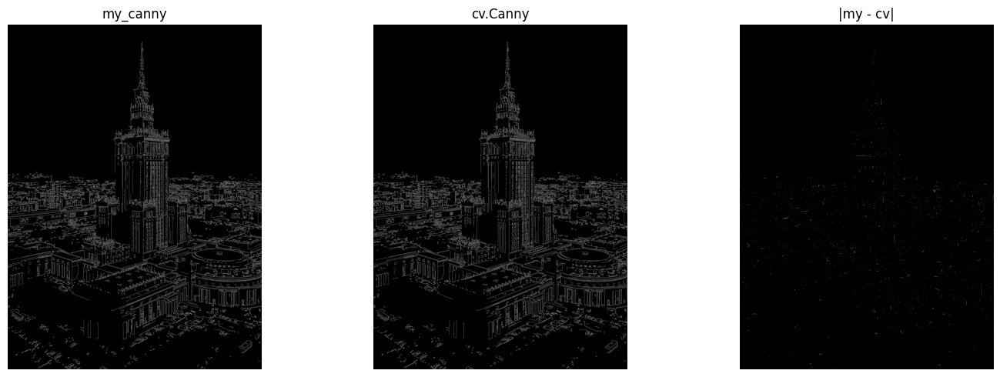

In [ ]:
T1, T2 = 100, 200
edges_my = my_canny(REF_IMG, T1, T2, aperture_size=3, L2gradient=False, gaussian_ksize=5, sigma=1.4)

# Aby porównanie było uczciwe, podajemy cv.Canny ten sam wstępnie
# rozmyty obraz (cv.Canny wewnętrznie też używa Sobela, ale Gauss
# zostawia użytkownikowi — tu robimy to jawnie).
blurred_for_cv = cv.GaussianBlur(REF_IMG, (5, 5), 1.4)
edges_cv = cv.Canny(blurred_for_cv, T1, T2, apertureSize=3, L2gradient=False)

inter = np.sum((edges_my > 0) & (edges_cv > 0))
union = np.sum((edges_my > 0) | (edges_cv > 0))
iou = inter / union if union else 0.0
print(f"IoU(my_canny, cv.Canny) = {iou:.4f}")

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(edges_my, cmap="gray"); axes[0].set_title("my_canny"); axes[0].axis("off")
axes[1].imshow(edges_cv, cmap="gray"); axes[1].set_title("cv.Canny"); axes[1].axis("off")
diff = cv.absdiff(edges_my, edges_cv)
axes[2].imshow(diff, cmap="gray"); axes[2].set_title("|my - cv|"); axes[2].axis("off")
plt.tight_layout(); plt.show()

## 7. Eksperymenty: wpływ parametrów na jakość detekcji

Po zweryfikowaniu, że `my_canny` odtwarza `cv.Canny`, sprawdziliśmy **wpływ poszczególnych parametrów i warunków przetwarzania na wyniki detekcji krawędzi algorytmem Canny'ego.**. Dla czytelności ograniczyliśmy się w tym notatniku do **wartości skrajnych** każdego parametru i zestawiliśmy je z **oryginałem** oraz **krawędzią referencyjną**.

#### Dobór obrazów

Eksperymenty uruchamiliśmy na **kilku obrazach naraz**. Można wybrać kilka lub tylko jeden obraz z listy `EXP_IMAGE_FILES` zakomentowując resztę. Wyniki są wyświetlane w siatce, gdzie **wiersz** dotyczy tego samego obrazu, a **kolumny** to kolejno: oryginał (referencja wizualna) + warianty skrajne danego parametru.

#### Metryki (liczone względem `cv.Canny(100, 200)` na czystym obrazie):

- **Precision** — jaka część wykrytych pikseli krawędzi jest trafna
- **Recall** — jaka część rzeczywistych krawędzi została wykryta
- **F1-score** — średnia harmoniczna Precision i Recall
- **Pratt's Figure of Merit (FOM)** — nagradza krawędzie blisko referencji (toleruje drobne przesunięcia).

> Eksperymenty korzystają z referencyjnego `cv.Canny` ze względu na szybkość obliczeń bibliotek pisanych w C++.

In [ ]:
# Konfiguracja eksperymentów: wybór obrazów z katalogu ./data
import glob as _glob
from scipy.ndimage import distance_transform_edt  # pyright: ignore[reportMissingImports]

# Edytuj tę listę, aby wybrać które obrazy mają być użyte w eksperymentach.
# Najlepiej 2-4 obrazy (każdy tworzy osobny WIERSZ w siatkach wyników).
EXP_IMAGE_FILES = [
    "./data/PKiN_widziany_z_WFC.jpg",
    "./data/ronaldo.jpg",
    "./data/cherries.png",
    "./data/DBS_Superleggera.jpg",
    "./data/SMALL_0001.tif",
    "./data/SMALL_0002.png",
    "./data/SMALL_0003.png",
    "./data/SMALL_0004.jpg",
    "./data/SMALL_0005.jpg",
    "./data/SMALL_0006.jpg",
    "./data/SMALL_0007.jpg",
    "./data/SMALL_0008.jpg",
    "./data/SMALL_0009.jpg",
    "./data/SMALL_0010.jpg"
    ]

EXP_IMAGES = [(os.path.basename(p), load_grayscale(p)) for p in EXP_IMAGE_FILES]
print("Obrazy eksperymentalne:")
for _name, _im in EXP_IMAGES:
    print(f"  - {_name:32s} shape={_im.shape}")

REF_T1_EXP, REF_T2_EXP = 100, 200


def reference_edges(img: np.ndarray) -> np.ndarray:
    '''Krawędzie referencyjne dla metryk: cv.Canny(100, 200) na czystym obrazie.'''
    return cv.Canny(img, REF_T1_EXP, REF_T2_EXP, apertureSize=3)


def edge_metrics(detected: np.ndarray, reference: np.ndarray, fom_alpha: float = 1.0 / 9.0) -> dict:
    """
    Oblicza metryki dla detekcji krawędzi: Precision, Recall, F1, Pratt's FOM.
    """
    det_bin = (detected > 0).astype(np.uint8)
    ref_bin = (reference > 0).astype(np.uint8)

    tp = np.sum(det_bin & ref_bin) # Wspólne piksele (detektor poprawnie wykrył krawędź)
    fp = np.sum(det_bin & (~ref_bin)) # Piksele wykryte przez detektor poza referencją
    fn = np.sum((~det_bin) & ref_bin) # Piksele krawędzi z referencji nie wykryte przez detektor

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0.0

    n_ref = max(int(np.sum(ref_bin)), 1)
    n_det = max(int(np.sum(det_bin)), 1)
    denom = max(n_ref, n_det)

    # Pratt's Figure of Merit (FOM)
    dist_from_ref = distance_transform_edt(1 - ref_bin)
    det_coords = np.argwhere(det_bin)
    if len(det_coords) == 0:
        fom = 0.0
    else:
        distances = dist_from_ref[det_coords[:, 0], det_coords[:, 1]]
        fom = (1.0 / denom) * np.sum(1.0 / (1.0 + fom_alpha * distances ** 2))

    return {"Precision": precision, "Recall": recall, "F1": f1, "FOM": fom}


def add_gaussian_noise(image: np.ndarray, sigma: float) -> np.ndarray:
    noise = np.random.normal(0, sigma, image.shape)
    return np.clip(image.astype(np.float64) + noise, 0, 255).astype(np.uint8)


def add_salt_and_pepper(image: np.ndarray, amount: float) -> np.ndarray:
    out = image.copy()
    n = image.size
    n_salt, n_pepper = int(n * amount / 2), int(n * amount / 2)
    out[tuple(np.random.randint(0, dim, n_salt) for dim in image.shape)] = 255
    out[tuple(np.random.randint(0, dim, n_pepper) for dim in image.shape)] = 0
    return out


def run_experiment(images: list, make_variants, suptitle: str, with_metrics: bool = True, figscale: float = 3.0) -> None:
    '''Siatka wyników: WIERSZ = obraz, KOLUMNY = [oryginał, warianty skrajne].
    images : lista (nazwa, obraz_gray)
    make_variants : funkcja(obraz) -> lista (etykieta, krawędzie)
    '''
    data = [(name, img, make_variants(img)) for name, img in images]
    n_rows = len(data)
    n_cols = 1 + len(data[0][2])

    aspects = [img.shape[0] / img.shape[1] for _, img, _ in data]
    cell_aspect = float(np.clip(np.median(aspects), 0.4, 2.2))
    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(figscale * n_cols, figscale * cell_aspect * n_rows),
                             squeeze=False, layout="constrained")
    fig.suptitle(suptitle, fontsize=15, fontweight='bold')

    rows_metrics = []
    for r, (name, img, variants) in enumerate(data):
        ref = reference_edges(img) if with_metrics else None
        axes[r][0].imshow(img, cmap='gray')
        axes[r][0].set_title(f"Oryginał\n{name}", fontsize=9)
        axes[r][0].axis('off')
        for c, (label, edges) in enumerate(variants, start=1):
            title = label
            if ref is not None:
                m = edge_metrics(edges, ref)
                rows_metrics.append((name, label, m))
                title = f"{label}\nF1={m['F1']:.3f}"
            axes[r][c].imshow(edges, cmap='gray')
            axes[r][c].set_title(title, fontsize=9)
            axes[r][c].axis('off')

    plt.show()

    if rows_metrics:
        print(f"{'Obraz':<24}{'Wariant':<26}{'Precision':>10}{'Recall':>9}{'F1':>9}{'FOM':>9}")
        print('-' * 87)
        for name, label, m in rows_metrics:
            print(f"{name:<24}{label:<26}{m['Precision']:10.4f}{m['Recall']:9.4f}"
                  f"{m['F1']:9.4f}{m['FOM']:9.4f}")


print("Środowisko eksperymentów gotowe.")

Obrazy eksperymentalne:
  - PKiN_widziany_z_WFC.jpg          shape=(2756, 2026)
  - ronaldo.jpg                      shape=(577, 1025)
  - cherries.png                     shape=(1080, 1920)
  - DBS_Superleggera.jpg             shape=(1459, 3000)
  - SMALL_0001.tif                   shape=(512, 512)
  - SMALL_0002.png                   shape=(215, 180)
  - SMALL_0003.png                   shape=(320, 256)
  - SMALL_0004.jpg                   shape=(80, 120)
  - SMALL_0005.jpg                   shape=(120, 80)
  - SMALL_0006.jpg                   shape=(80, 120)
  - SMALL_0007.jpg                   shape=(120, 80)
  - SMALL_0008.jpg                   shape=(80, 120)
  - SMALL_0009.jpg                   shape=(120, 80)
  - SMALL_0010.jpg                   shape=(80, 120)
Środowisko eksperymentów gotowe.


### 7.1. Progi histerezy `threshold1`, `threshold2`

Progi sterują kompromisem **między redukcją szumu, a czułością detekcji krawędzi**. Sprawdziliśmy trzy ustawienia:
minimalne `(1, 2)`, referencyjne `(100, 200)` i bardzo wysokie `(500, 900)`.

**Obserwacje:** 
- przy minimalnych progach mapa "tonie" w szumie i teksturze (wysoki Recall, niski Precision), 
- przy bardzo wysokich progach pozostają tylko najsilniejsze kontury (wysoki Precision, niski Recall, dużo urwanych krawędzi).

**Wnioski:** 
- progi to najsilniejsze "suwaki" jakości — optymalne wartości zależą od kontrastu i poziomu szumu konkretnego obrazu, 
- ta sama para progów daje **różne F1 dla różnych zdjęć** (widać to porównując wiersze).

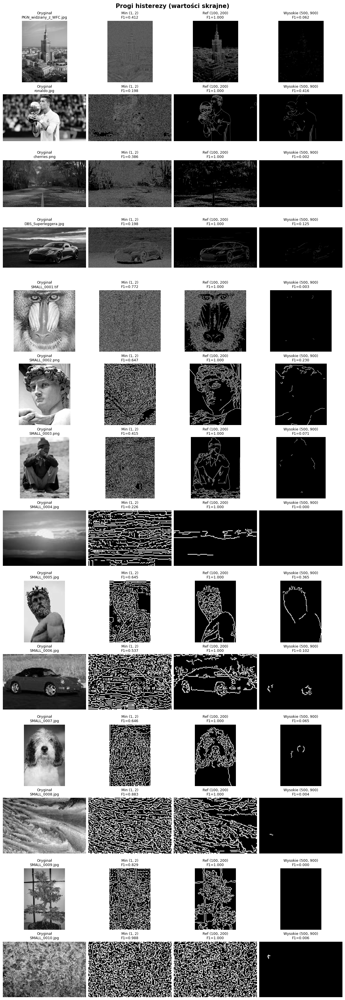

Obraz                   Wariant                    Precision   Recall       F1      FOM
---------------------------------------------------------------------------------------
PKiN_widziany_z_WFC.jpg Min (1, 2)                    0.2592   1.0000   0.4117   0.3479
PKiN_widziany_z_WFC.jpg Ref (100, 200)                1.0000   1.0000   1.0000   1.0000
PKiN_widziany_z_WFC.jpg Wysokie (500, 900)            1.0000   0.0320   0.0620   0.0320
ronaldo.jpg             Min (1, 2)                    0.1096   1.0000   0.1976   0.1604
ronaldo.jpg             Ref (100, 200)                1.0000   1.0000   1.0000   1.0000
ronaldo.jpg             Wysokie (500, 900)            1.0000   0.2625   0.4159   0.2625
cherries.png            Min (1, 2)                    0.2392   1.0000   0.3860   0.3534
cherries.png            Ref (100, 200)                1.0000   1.0000   1.0000   1.0000
cherries.png            Wysokie (500, 900)            1.0000   0.0012   0.0025   0.0012
DBS_Superleggera.jpg    Min (1, 

In [ ]:
def variants_thresholds(img):
    configs = [
        (1, 2, "Min (1, 2)"),
        (100, 200, "Ref (100, 200)"),
        (500, 900, "Wysokie (500, 900)"),
        ]
    return [(lbl, cv.Canny(img, t1, t2, apertureSize=3)) for t1, t2, lbl in configs]


run_experiment(EXP_IMAGES, variants_thresholds, "Progi histerezy (wartości skrajne)", figscale=3.0)

### 7.2. Rozmiar jądra Gaussa

Wstępne rozmycie tłumi szum przed liczeniem gradientu. Porównaliśmy: **brakrozmycia**, **umiarkowane** `5x5` i **agresywne** `31x31`.

**Obserwacje:**
- bez rozmycia pojawia się dużo drobnych i zaszumionych krawędzi,
- rozmycie `31x31` usuwa detale i **zaokrągla/przesuwa**
kontury — zostają tylko najgrubsze kształty.

**Wnioski:**
- większe jądro to mniej szumu, ale gorsza detekcja i utrata drobnych krawędzi.
- Rozmiar rozmycia `5x5` to bezpieczny kompromis.

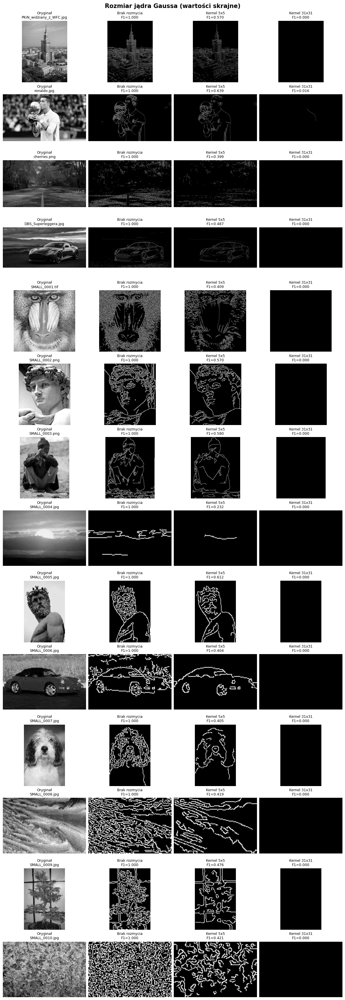

Obraz                   Wariant                    Precision   Recall       F1      FOM
---------------------------------------------------------------------------------------
PKiN_widziany_z_WFC.jpg Brak rozmycia                 1.0000   1.0000   1.0000   1.0000
PKiN_widziany_z_WFC.jpg Kernel 5x5                    0.7874   0.4469   0.5702   0.5550
PKiN_widziany_z_WFC.jpg Kernel 31x31                  0.0000   0.0000   0.0000   0.0000
ronaldo.jpg             Brak rozmycia                 1.0000   1.0000   1.0000   1.0000
ronaldo.jpg             Kernel 5x5                    0.7937   0.5353   0.6394   0.6597
ronaldo.jpg             Kernel 31x31                  0.6000   0.0080   0.0158   0.0128
cherries.png            Brak rozmycia                 1.0000   1.0000   1.0000   1.0000
cherries.png            Kernel 5x5                    0.7816   0.2681   0.3993   0.3347
cherries.png            Kernel 31x31                  0.0000   0.0000   0.0000   0.0000
DBS_Superleggera.jpg    Brak roz

In [ ]:
def variants_gauss(img):
    out = []
    for k, lbl in [(0, "Brak rozmycia"), (5, "Kernel 5x5"), (31, "Kernel 31x31")]:
        blurred = img if k == 0 else cv.GaussianBlur(img, (k, k), 0)
        out.append((lbl, cv.Canny(blurred, 100, 200, apertureSize=3)))
    return out


run_experiment(EXP_IMAGES, variants_gauss, "Rozmiar jądra Gaussa (wartości skrajne)", figscale=3.0)

### 7.3. Norma gradientu: L1 vs L2

Magnituda gradientu liczona jako `|Gx| + |Gy|` (**L1**, szybsza) lub
`sqrt(Gx² + Gy²)` (**L2**, dokładniejsza), sterowana flagą `L2gradient`.

**Obserwacje:**
- różnice są zwykle **marginalne** i widoczne głównie wzdłuż
krawędzi diagonalnych (gdzie L1 zawyża magnitudę).
- Mapy są niemal identyczne.

**Wnioski:**
- wybór normy ma drugorzędne znaczenie
- po ponownym dobraniu progów L1 i L2 dają praktycznie ten sam wynik
- L1 bywa szybsza.

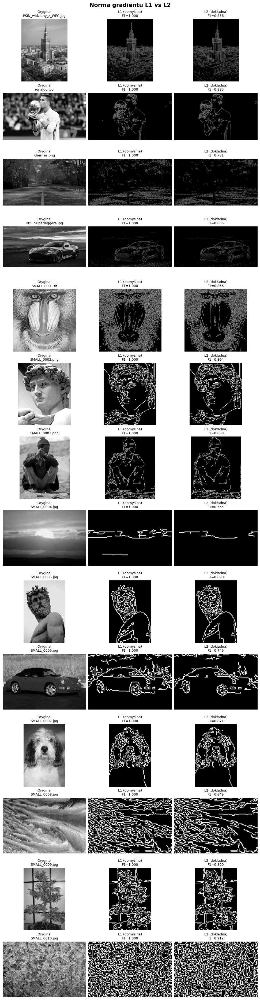

Obraz                   Wariant                    Precision   Recall       F1      FOM
---------------------------------------------------------------------------------------
PKiN_widziany_z_WFC.jpg L1 (domyślna)                 1.0000   1.0000   1.0000   1.0000
PKiN_widziany_z_WFC.jpg L2 (dokładna)                 0.9346   0.7901   0.8563   0.8387
ronaldo.jpg             L1 (domyślna)                 1.0000   1.0000   1.0000   1.0000
ronaldo.jpg             L2 (dokładna)                 0.9498   0.8288   0.8852   0.8671
cherries.png            L1 (domyślna)                 1.0000   1.0000   1.0000   1.0000
cherries.png            L2 (dokładna)                 0.9233   0.6766   0.7809   0.7247
DBS_Superleggera.jpg    L1 (domyślna)                 1.0000   1.0000   1.0000   1.0000
DBS_Superleggera.jpg    L2 (dokładna)                 0.9571   0.6945   0.8049   0.7179
SMALL_0001.tif          L1 (domyślna)                 1.0000   1.0000   1.0000   1.0000
SMALL_0001.tif          L2 (dokł

In [ ]:
def variants_l1l2(img):
    return [
        ("L1 (domyślna)", cv.Canny(img, 100, 200, apertureSize=3, L2gradient=False)),
        ("L2 (dokładna)", cv.Canny(img, 100, 200, apertureSize=3, L2gradient=True)),
        ]


run_experiment(EXP_IMAGES, variants_l1l2, "Norma gradientu L1 vs L2", figscale=3.2)

### 7.4. Preprocessing przed detekcją

Wpływ wstępnego przetwarzania kontrastu/szumu:
- **equalizacja histogramu**,
- **CLAHE**,
- **filtr medianowy** i **bilateralny**,

Wyniki zestawiliśmy ze sobą i obrazem surowym.

> Tu **ograniczyliśmy** wyświetlanie do samych wykrytych **krawędzi na obrazie** po ich przetworzeniu.

**Obserwacje:**
- equalizacja i CLAHE **wzmacniają kontrast** więc pojawia się więcej krawędzi (także w cieniach), ale też więcej szumu,
- median oraz bilateralny **wygładzają**, redukują drobne krawędzie przy zachowaniu głównych konturów.

**Wnioski:**
- preprocessing przesuwa balans Precision/Recall,
- dobór zależy od celu (więcej detali czy czystsza mapa krawędzi?).

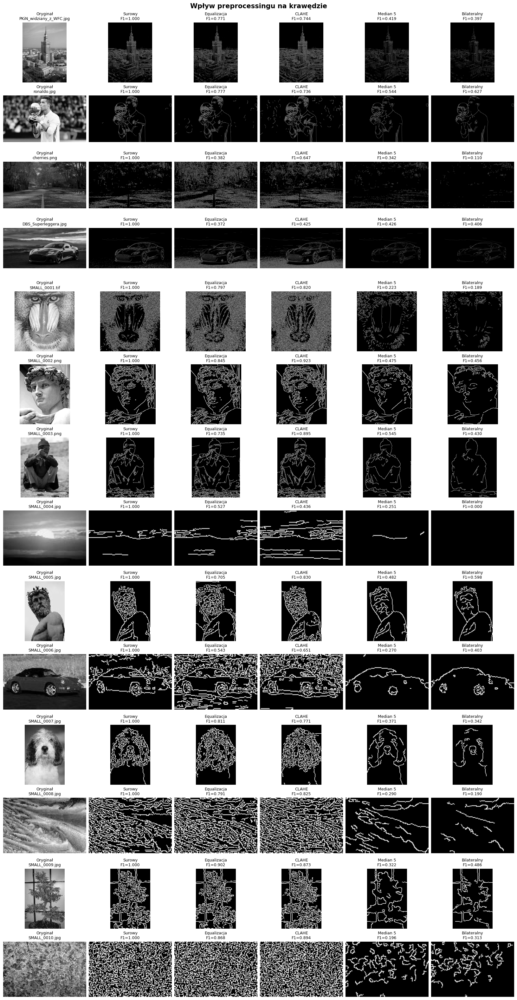

Obraz                   Wariant                    Precision   Recall       F1      FOM
---------------------------------------------------------------------------------------
PKiN_widziany_z_WFC.jpg Surowy                        1.0000   1.0000   1.0000   1.0000
PKiN_widziany_z_WFC.jpg Equalizacja                   0.7789   0.7628   0.7708   0.9245
PKiN_widziany_z_WFC.jpg CLAHE                         0.6571   0.8562   0.7435   0.8247
PKiN_widziany_z_WFC.jpg Median 5                      0.6331   0.3135   0.4193   0.4755
PKiN_widziany_z_WFC.jpg Bilateralny                   0.8210   0.2616   0.3968   0.3127
ronaldo.jpg             Surowy                        1.0000   1.0000   1.0000   1.0000
ronaldo.jpg             Equalizacja                   0.7733   0.7800   0.7767   0.8869
ronaldo.jpg             CLAHE                         0.6342   0.8762   0.7359   0.7541
ronaldo.jpg             Median 5                      0.7158   0.4384   0.5438   0.5924
ronaldo.jpg             Bilatera

In [ ]:
def variants_preproc(img):
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    procs = [
        ("Surowy", img),
        ("Equalizacja", cv.equalizeHist(img)),
        ("CLAHE", clahe.apply(img)),
        ("Median 5", cv.medianBlur(img, 5)),
        ("Bilateralny", cv.bilateralFilter(img, 9, 75, 75)),
        ]
    return [(lbl, cv.Canny(p, 100, 200, apertureSize=3)) for lbl, p in procs]


run_experiment(EXP_IMAGES, variants_preproc, "Wpływ preprocessingu na krawędzie", figscale=2.7)

### 7.5. Operator gradientu: Sobel (apertureSize 3/5/7) vs Scharr

`cv.Canny` używa Sobela o `apertureSize ∈ {3, 5, 7}`. Porównaliśmy je z
operatorem **Scharr** (osobne jądro `3×3` o mniejszym błędzie kierunkowym).
Dla ap=5 i ap=7 pokazujemy też wynik z **progami przeskalowanymi** do większej maski.

**Obserwacje:**
- sobel ap=3 jest tutaj referencją (F1=1.000),
- przy stałych progach ap=5 i ap=7 dają więcej szumu — mapy krawędzi są ziarniste,
- po przeskalowaniu progów (x12 dla ap=5 i x160 dla ap=7) mapy są czyste i zbliżone do ap=3,
- scharr wbrew pozorom jest najbliższy referencji ale znajduje znacznie więcej krawędzi,
- scharr przed NMS w porównaniu z Soblem daje mocniejszy (grubszy) szkic krawędzi.

**Wnioski:**
- Większa maska wymaga wyższych progów — `cv.Canny` ich nie skaluje.
- Większa apertura (z dopasowanymi progami) tłumi szum i daje gładsze kontury, ale kosztem dokładnej lokalizacji i drobnych detali konturu.
- Scharr dokładniej szacuje kierunek gradientu niż Sobel `3x3` (mniejszy błąd kątowy, zwłaszcza na skosach), dlatego NMS daje gładsze, mniej postrzępione (ciągłe) kontury.

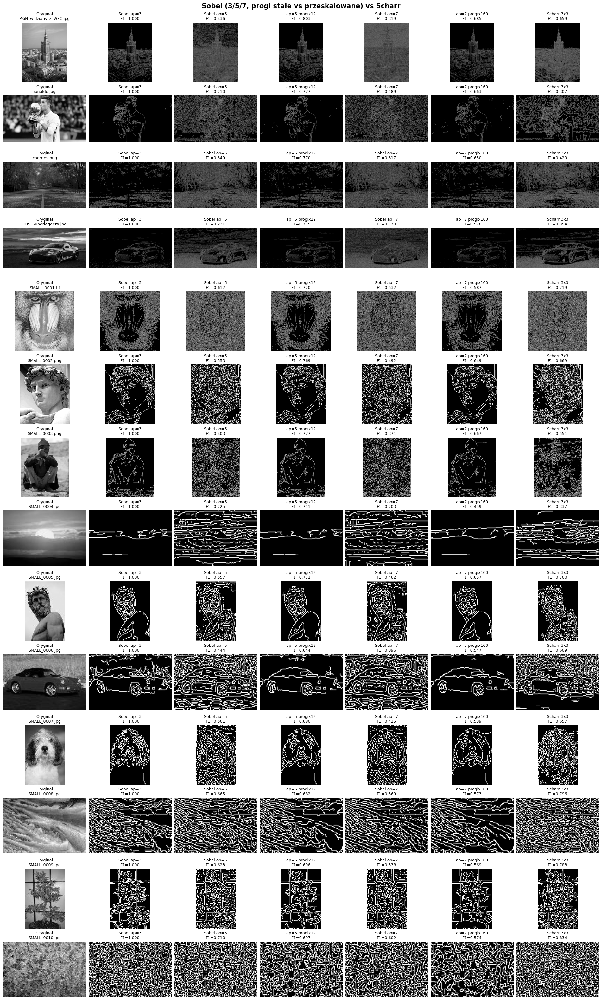

Obraz                   Wariant                    Precision   Recall       F1      FOM
---------------------------------------------------------------------------------------
PKiN_widziany_z_WFC.jpg Sobel ap=3                    1.0000   1.0000   1.0000   1.0000
PKiN_widziany_z_WFC.jpg Sobel ap=5                    0.2963   0.8282   0.4364   0.4357
PKiN_widziany_z_WFC.jpg ap=5 progix12                 0.8322   0.7759   0.8030   0.9027
PKiN_widziany_z_WFC.jpg Sobel ap=7                    0.2061   0.7066   0.3191   0.3270
PKiN_widziany_z_WFC.jpg ap=7 progix160                0.7448   0.6347   0.6854   0.8159
PKiN_widziany_z_WFC.jpg Scharr 3x3                    0.4966   0.9780   0.6587   0.6579
ronaldo.jpg             Sobel ap=3                    1.0000   1.0000   1.0000   1.0000
ronaldo.jpg             Sobel ap=5                    0.1201   0.8237   0.2096   0.1872
ronaldo.jpg             ap=5 progix12                 0.7786   0.7753   0.7770   0.9188
ronaldo.jpg             Sobel ap

In [ ]:
def sobel_gain(aperture):
    '''Przybliżone wzmocnienie magnitudy Sobela dla danej maski (względem ap=3).'''
    kx, ky = cv.getDerivKernels(1, 0, aperture)   # kx: pochodna, ky: wygładzanie
    kx, ky = kx.flatten().astype(float), ky.flatten().astype(float)
    return ky.sum() * kx[kx > 0].sum()


_G3 = sobel_gain(3)


def variants_operator(img):
    out = []
    for a in (3, 5, 7):
        out.append((f"Sobel ap={a}", cv.Canny(img, 100, 200, apertureSize=a)))
        if a > 3:
            s = sobel_gain(a) / _G3
            out.append((f"ap={a} progix{s:.0f}",
                        cv.Canny(img, int(100 * s), int(200 * s), apertureSize=a)))
    dx = cv.Scharr(img, cv.CV_16S, 1, 0)
    dy = cv.Scharr(img, cv.CV_16S, 0, 1)
    out.append(("Scharr 3x3", cv.Canny(dx, dy, 100, 200)))
    return out


run_experiment(EXP_IMAGES, variants_operator, "Sobel (3/5/7, progi stałe vs przeskalowane) vs Scharr", figscale=2.7)

### 7.6. Szum: Gaussowski vs sól i pieprz

Detekcja jest wrażliwa na szum. Porównaliśmy wykryte krawędzie w obrazach skażonych szumem **Gaussowskim** (`σ=15` – lekki, `σ=85` – silny) i szumem typu **sól i pieprz** (`5%` – lekki, `10%` – średni).

**Obserwacje:**
- szum Gaussowski degraduje mapę **stopniowo** (rosnący gąszcz
fałszywych krawędzi),
- sól i pieprz tworzy **punktowe** artefakty już przy małym
udziale, a przy większym drastycznie psuje wynik.

**Wnioski:**
- Kluczowy jest pierwszy etap w algorytmie Canny'ego (rozmycie).
- Dla szumu impulsowego (sól i pieprz) skuteczniejszy jest filtr medianowy niż Gaussa.

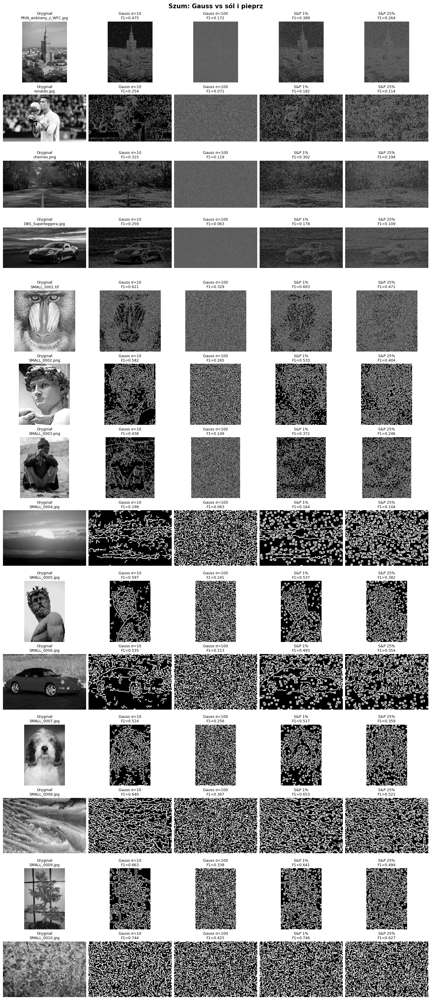

Obraz                   Wariant                    Precision   Recall       F1      FOM
---------------------------------------------------------------------------------------
PKiN_widziany_z_WFC.jpg Gauss σ=10                    0.3543   0.7209   0.4751   0.6001
PKiN_widziany_z_WFC.jpg Gauss σ=100                   0.1067   0.4449   0.1721   0.3453
PKiN_widziany_z_WFC.jpg S&P 1%                        0.2616   0.7586   0.3890   0.4467
PKiN_widziany_z_WFC.jpg S&P 25%                       0.1670   0.6324   0.2642   0.3740
ronaldo.jpg             Gauss σ=10                    0.1520   0.7800   0.2544   0.2429
ronaldo.jpg             Gauss σ=100                   0.0382   0.4975   0.0710   0.1290
ronaldo.jpg             S&P 1%                        0.1029   0.7932   0.1822   0.1811
ronaldo.jpg             S&P 25%                       0.0625   0.6749   0.1143   0.1453
cherries.png            Gauss σ=10                    0.2069   0.6588   0.3149   0.4408
cherries.png            Gauss σ=

In [ ]:
np.random.seed(42)


def variants_noise(img):
    return [
        ("Gauss σ=10",  cv.Canny(add_gaussian_noise(img, 15),   100, 200, apertureSize=3)),
        ("Gauss σ=100", cv.Canny(add_gaussian_noise(img, 85),  100, 200, apertureSize=3)),
        ("S&P 1%",      cv.Canny(add_salt_and_pepper(img, 0.05), 100, 200, apertureSize=3)),
        ("S&P 25%",     cv.Canny(add_salt_and_pepper(img, 0.10), 100, 200, apertureSize=3)),
        ]


run_experiment(EXP_IMAGES, variants_noise, "Szum: Gauss vs sól i pieprz", figscale=2.9)

### 7.7. Podsumowanie eksperymentów

| Parametr / czynnik | Wartości | Kluczowa obserwacja |
|---|---|---|
| **Progi histerezy** | (1, 2) i (500, 900) | niskie wartości powodują nadmiar krawędzi/szum (Recall rośnie, Precision maleje); wysokie to tylko silne kontury (Precision rośnie, Recall maleje) |
| **Jądro Gaussa** | brak i 31x31 | większe jądro to mniej szumu, ale rozmyte i przesunięte krawędzie oraz utrata detali |
| **Norma L1 vs L2** | L1 i L2 | różnica marginalna, głównie na diagonalach; po dobraniu progów wynik praktycznie ten sam |
| **Preprocessing** | surowy i CLAHE / median / bilateralny | equalizacja/CLAHE wzmacniają kontrast (więcej krawędzi), filtry wygładzające redukują drobne krawędzie |
| **Sobel vs Scharr** | ap = 3/5/7 | większy apertureSize to grubsze krawędzie i mniej szumu przed NMS; Scharr stabilniejszy kierunkowo przy 3x3 |
| **Szum** | Gauss σ=15/85 i S&P 5%/10% | Gauss degraduje płynnie; sól i pieprz tworzy punktowe artefakty — wymaga filtru medianowego |

#### Wniosek ogólny wynikający z naszych eksperymentów:
Największy wpływ na jakość mają **progi histerezy** oraz
**poziom/typ szumu i wstępne wygładzanie**. Wybór operatora (Sobel/Scharr) i
normy (L1/L2) ma znaczenie drugorzędne. Optymalne parametry **zależą od obrazu**
— widać to porównując wartości F1 dla różnych zdjęć (wierszy) w powyższych
siatkach.

## 8. Interaktywne demo

Suwaki + checkboxy pozwalają na żywo zmieniać parametry `my_canny`
i obserwować, jak każda zmiana wpływa na wynik. Demo zbudowane jest
z kilku małych komórek odpowiadających elementom GUI:

1. stan + obraz domyślny,
2. definicje widgetów sterujących,
3. obsługa wgrywania własnego pliku,
4. funkcja `render()` rysująca aktualny wynik,
5. podpięcie zdarzeń,
6. wyświetlenie kontrolek + obrazu wynikowego.

### 8.1. Stan aplikacji i obraz domyślny

`_state` trzyma aktualnie wyświetlany obraz (`img`) i jego opis (`source`).
Wszystkie callbacki — zmiana próbki, wgranie pliku, ruch suwakiem —
modyfikują tylko ten słownik i wywołują `render()`.

In [ ]:
DEFAULT_NAME = next(iter(SAMPLES.keys()))
_state = {
    "img":    load_grayscale(SAMPLES[DEFAULT_NAME]),
    "source": DEFAULT_NAME,
    }
print(f"Obraz domyślny w demo: {_state['source']}, shape = {_state['img'].shape}")

Obraz domyślny w demo: PKiN (./data/PKiN_widziany_z_WFC.jpg), shape = (2756, 2026)


### 8.2. Widgety sterujące

Każdy widget odpowiada jednemu parametrowi `my_canny` (lub przełącza widok).

| Widget | Parametr | Znaczenie |
|---|---|---|
| `sample_dd` | — | wybór obrazu z `./data` |
| `upload` | — | wgranie własnego obrazu (JPEG/PNG) |
| `t1` | `threshold1` | dolny próg histerezy |
| `t2` | `threshold2` | górny próg histerezy |
| `g_ksize` | `gaussian_ksize` | rozmiar jądra Gaussa (nieparzysty) |
| `sigma_w` | `sigma` | σ Gaussa (0 to konwencja OpenCV) |
| `aperture_w` | `aperture_size` | rozmiar maski Sobela (3 / 5 / 7) |
| `L2_w` | `L2gradient` | norma L2 zamiast L1 dla magnitudy |
| `scharr_w` | `use_scharr` | Scharr zamiast Sobela |
| `show_cv_w` | — | wyświetla referencję `cv.Canny` obok wyniku |

In [ ]:
sample_dd = widgets.Dropdown(
    options=list(SAMPLES.keys()), value=DEFAULT_NAME,
    description="Obraz:", layout=widgets.Layout(width="380px"),
    )
upload = widgets.FileUpload(
    accept="image/*", multiple=False,
    description="…lub wgraj plik", layout=widgets.Layout(width="220px"),
    )

t1 = widgets.IntSlider(value=100, min=0, max=1000, step=5, description="Próg 1", continuous_update=False, layout=widgets.Layout(width="380px"))
t2 = widgets.IntSlider(value=200, min=0, max=1000, step=5, description="Próg 2", continuous_update=False, layout=widgets.Layout(width="380px"))

g_ksize = widgets.IntSlider(value=5, min=1, max=31, step=2, description="Gauss k", continuous_update=False, layout=widgets.Layout(width="380px"))
sigma_w = widgets.FloatText(value=1.4, step=0.1, description="Sigma", layout=widgets.Layout(width="180px"))

aperture_w = widgets.Dropdown(options=[3, 5, 7], value=3, description="apertureSize", layout=widgets.Layout(width="180px"))
L2_w       = widgets.Checkbox(value=False, description="L2 gradient")
scharr_w   = widgets.Checkbox(value=False, description="Scharr")
show_cv_w  = widgets.Checkbox(value=False, description="Pokaż cv.Canny")

status_label = widgets.HTML()
img_widget   = widgets.Image(format="png", layout=widgets.Layout(max_width="1100px"))

### 8.3. Obsługa wgrywania obrazu

`ipywidgets.FileUpload` ma różny format `.value` między wersjami 7 (dict)
a 8 (tuple). Funkcja `_load_uploaded` przykrywa tę różnicę i zwraca
gotowy obraz w skali szarości albo `None`, jeśli nic nie wgrano.

In [ ]:
def _load_uploaded(file_obj) -> np.ndarray | None:
    '''Odczytanie pliku z ipywidgets.FileUpload (v7 / v8).'''
    if not file_obj:
        return None
    try:
        first = file_obj[0] if isinstance(file_obj, (tuple, list)) else next(iter(file_obj.values()))
    except StopIteration:
        return None
    content = first["content"] if isinstance(first, dict) else first.content
    if isinstance(content, memoryview):
        content = bytes(content)
    arr = np.frombuffer(content, dtype=np.uint8)
    return cv.imdecode(arr, cv.IMREAD_GRAYSCALE)

### 8.4. Funkcja renderująca wynik

Funkcja `render()`:

1. czyta aktualny obraz z `_state` i wartości wszystkich widgetów,
2. uruchamia `my_canny` (oraz opcjonalnie `cv.Canny` z tym samym wygładzaniem dla porównania),
3. rysuje wynik w `matplotlib.Figure`,
4. aktualizuje pasek statusu.

In [ ]:
def _figure_to_png_bytes(fig: Figure) -> bytes:
    '''Renderuje Figure do PNG-bajtów (bez pyplot, żeby uniknąć dublowania).'''
    canvas = FigureCanvasAgg(fig)
    buf = io.BytesIO()
    canvas.print_png(buf)
    return buf.getvalue()


def render(*_):
    img = _state["img"]
    if img is None:
        status_label.value = "<b>Brak załadowanego obrazu.</b>"
        img_widget.value = b""
        return

    # Gauss k musi być nieparzyste
    ksize = g_ksize.value if g_ksize.value % 2 == 1 else g_ksize.value + 1

    edges = my_canny(
        img,
        t1.value, t2.value,
        aperture_size=aperture_w.value,
        L2gradient=L2_w.value,
        gaussian_ksize=ksize,
        sigma=sigma_w.value,
        use_scharr=scharr_w.value,
        )

    n_panels = 3 if show_cv_w.value else 2
    fig = Figure(figsize=(5.5 * n_panels, 5.5), dpi=100)
    axes = fig.subplots(1, n_panels)

    axes[0].imshow(img, cmap="gray")
    axes[0].set_title(f"Oryginał — {_state['source']}", fontsize=10)
    axes[0].axis("off")

    op = "Scharr" if scharr_w.value else f"Sobel {aperture_w.value}x{aperture_w.value}"
    axes[1].imshow(edges, cmap="gray")
    axes[1].set_title(
        f"my_canny  T=({t1.value},{t2.value}) | k={ksize} | σ={sigma_w.value} | "
        f"{op} | {'L2' if L2_w.value else 'L1'}",
        fontsize=9,
        )
    axes[1].axis("off")

    if show_cv_w.value:
        cv_blurred = img if ksize <= 1 else cv.GaussianBlur(img, (ksize, ksize), sigma_w.value)
        cv_edges = cv.Canny(cv_blurred, t1.value, t2.value, apertureSize=aperture_w.value, L2gradient=L2_w.value)
        axes[2].imshow(cv_edges, cmap="gray")
        axes[2].set_title("cv.Canny (referencja)", fontsize=10)
        axes[2].axis("off")

    fig.tight_layout()
    img_widget.value = _figure_to_png_bytes(fig)
    status_label.value = (
        f"<code>{_state['source']}</code> &nbsp; "
        f"T=({t1.value},{t2.value}) | k={ksize} | σ={sigma_w.value} | "
        f"{op} | {'L2' if L2_w.value else 'L1'}"
        )

### 8.5. Podpięcie zdarzeń

Każdy widget wywołuje `render()` przy zmianie wartości, a wybór próbki lub
wgranie pliku dodatkowo aktualizuje `_state`.

In [ ]:
def on_sample_change(_change):
    loaded = load_grayscale(SAMPLES[sample_dd.value])
    _state["img"] = loaded
    _state["source"] = sample_dd.value
    render()


def on_upload_change(_change):
    loaded = _load_uploaded(upload.value)
    if loaded is None:
        return
    _state["img"] = loaded
    try:
        first = (upload.value[0] if isinstance(upload.value, (tuple, list))
                 else next(iter(upload.value.values())))
        _state["source"] = (first.get("name", "upload")
                            if isinstance(first, dict) else first.name)
    except Exception:
        _state["source"] = "upload"
    render()


sample_dd.observe(on_sample_change, names="value")
upload.observe(on_upload_change, names="value")
for w in (t1, t2, sigma_w, g_ksize, aperture_w, L2_w, scharr_w, show_cv_w):
    w.observe(render, names="value")

### 8.6. Wyświetlenie interfejsu

Składamy kontrolki w `VBox`/`HBox`, robimy pierwszy `render()` i wyświetlamy
panel oraz obraz wynikowy. Każda zmiana suwaka/checkboxa odświeży wynik
automatycznie — `render()` nie trzeba wywoływać ręcznie ponownie.

> **Uwaga:** jeżeli po uruchomieniu tej komórki widzisz tylko tekst `VBox(children=...)` / `Image(value=...)` — restartuj kernel i uruchom cały notatnik od góry. Widgety `ipywidgets` wymagają aktywnego kernela, bo ich stan jest po stronie procesu Pythona, a nie w pliku `.ipynb`.

In [ ]:
controls = widgets.VBox([
    widgets.HBox([sample_dd, upload]),
    widgets.HBox([t1, t2]),
    widgets.HBox([g_ksize, sigma_w]),
    widgets.HBox([aperture_w, L2_w, scharr_w, show_cv_w]),
    status_label,
    ])

render()
display(controls, img_widget)

Image(value=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x04L\x00\x00\x02&\x08\x06\x00\x00\x00I\xbe\x1f\xbc\x…

## 9. Krótkie wnioski

- **Progi histerezy** — najsilniej kontrolują kompromis między czułością, a szumem.
  Zwiększenie `threshold2` redukuje liczbę krawędzi (zostają tylko silne
  gradienty). Zbyt niskie `threshold1` powoduje wykrywanie szumu jako krawędzi.
- **Filtr Gaussa** — większy `gaussian_ksize` / większa `sigma` skuteczniej
  tłumi szum, ale traci drobne krawędzie i lokalizację (krawędzie się
  "przesuwają"). Domyślne `k=5, σ=1.4` to bezpieczny kompromis.
- **Sobel vs Scharr** — Scharr `3×3` jest często stabilniejszy
  od Sobela `3×3` (mniejszy błąd kierunkowy to dokładniejszy "szkic" krawędzi przed NMS).
  Większy `apertureSize` (Sobel 5/7) wygładza gradient i tłumi szum,
  ale obniża rozdzielczość krawędzi.
- **Norma L1 vs L2** — L2 (`sqrt(Gx²+Gy²)`) jest matematycznie poprawniejsza,
  L1 (`|Gx|+|Gy|`) jest szybsza i dla większości obrazów daje praktycznie
  ten sam wynik (po ponownym dobraniu progów). Różnica magnitudy jest
  największa wzdłuż kierunków diagonalnych.
- **Porównanie z `cv.Canny`** — przy tym samym wstępnym wygładzaniu
  (`cv.GaussianBlur` z tymi samymi parametrami) IoU sięga ~0.94–0.96
  na typowych obrazach. Resztkowe ~5% pikseli różnicy to drobne
  rozjazdy na granicach sektorów NMS (`arctan2` vs porównanie
  `tan(22.5°)·|G_x|` z `|G_y|`) i inne traktowanie brzegów obrazu
  (`reflect` vs `BORDER_REPLICATE`).

  >TO DO: [`wnioski - głównie w zakresie stosowalności metody na podstawie własnych eksperymentów - kiedy się sprawdza, kiedy nie itd.`]

**Wnioski**

Algorytm Canny'ego w przeprowadzonych eksperymentach sprawdza się jako
szybki, przewidywalny detektor konturów o wysokiej jakości wizualnej,
o ile spełnione są trzy warunki:
  (a) obraz ma wyraźne lokalne zmiany jasności (krawędzie są „ostre”),
  (b) progi histerezowe są dopasowane do kontrastu i szumu,
  (c) ewentualny preprocessing jest dobrany do problemu (szum, oświetlenie).

Metoda NIE jest „plug-and-play”: ten sam zestaw parametrów (T1=100, T2=200)
działa dobrze na czystym obrazie referencyjnym, ale przy skrajnych progach,
nadmiarowym rozmyciu lub szumie wynik staje się bezużyteczny albo drastycznie
odbiega od oczekiwań. Stosowalność zależy więc bardziej od procedury strojenia
parametrów niż od samej implementacji OpenCV.

Obraz PKiN (konstrukcja na tle nieba) przy referencyjnych progach daje
spójny szkielet konturów: główne elementy konstrukcji, krawędzie budynków
w tle, linie przestrzenne. To typ zastosowania, w którym Canny jest
naturalnym wyborem:
  • inspekcja wizualna struktur,
  • wstępna segmentacja przed transformacją Hougha / dopasowaniem kształtów,
  • ekstrakcja konturów do dalszego przetwarzania (morning, skeleton),
  • szybkie prototypowanie w projektach laboratoryjnych i inżynieryjnych.

Przy takich obrazach niska norma L1 (domyślna w OpenCV) i apertureSize=3
wystarczają – różnica L2 vs L1 to tylko ~2,37% pikseli (F1 spada z 1,0
do ~0,86 względem referencji L1), co wizualnie jest marginalne. Sama różnica między L1 i L2 jest marginalna (praktycznie niezauważalna).

Canny sprawdza się więc z CLAHE/equalizacją, gdy celem jest wykryć więcej
konturów w ciemnych lub płaskich regionach – np. dokumenty, detale fasady
w cieniu – pod warunkiem akceptacji większej liczby fałszywych odpowiedzi
i ponownego dostrojenia progów (bo kontrast globalnie się zmienia).

**Stosowalność**

- Obrazy z dobrym kontrastem;
- Cienkie krawędzie;
- Wyszukujemy krawędzi na zaszumionym obrazie;
- Potrzeba redukcji fałszywych krawędzi

Typowe zastosowania:
- Sprawdzanie kształtu części na taśmie produkcyjnej, mierzenie odstępów.
- Wykrywanie granic kartki papieru w celu jej wyprostowania i przycięcia.
- Wykrywanie pasów ruchu na jezdni (białe linie na ciemnym asfalcie).
- Rozpoznawanie tekstu (OCR): Jako krok wstępny do wyizolowania liter od tła.